# **LIBRARIES**

In [1]:
import os
import sys
import glob
import copy
import time
import warnings
import json
import platform
import numpy as np
import pandas as pd
from pathlib import Path
from collections import Counter
import torch
import torch.nn as nn
from torch.nn import functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, ConcatDataset, random_split
import torchvision.transforms as T
import torchvision.transforms.functional as TF
from PIL import Image
from tqdm.auto import tqdm
import albumentations as A
from albumentations.pytorch import ToTensorV2
from transformers import SegformerForSemanticSegmentation, SegformerConfig
import matplotlib.pyplot as plt

# For reproducibility
np.random.seed(42)
torch.manual_seed(42)

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")

/home/johnh/miniconda3/envs/nyuv2_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


PyTorch version: 2.7.1
CUDA available: True


# **DATASET PATHS**

In [2]:
get_path = os.environ.get("UNI_PATH")  # set this env var to your data root, or hardcode below
DATA_PATH = Path(get_path).resolve()

# Dataset root - standard Cityscapes format
CITYSCAPES_ROOT = DATA_PATH / "Datasets" / "CityScapes5000"

# Image and label directories (standard Cityscapes structure)
IMAGES_DIR = CITYSCAPES_ROOT / "leftImg8bit"
LABELS_DIR = CITYSCAPES_ROOT / "gtFine"

print("=" * 60)
print("DATASET PATHS")
print("=" * 60)
print(f"Cityscapes root: {CITYSCAPES_ROOT}")
print(f"  Exists: {CITYSCAPES_ROOT.exists()}")
print(f"\nImages dir: {IMAGES_DIR}")
print(f"  Exists: {IMAGES_DIR.exists()}")
print(f"\nLabels dir: {LABELS_DIR}")
print(f"  Exists: {LABELS_DIR.exists()}")

# Experiments directory (for saving plots and weights)
EXPERIMENTS_DIR = DATA_PATH / 'MachineLearning' / 'experiments'
EXPERIMENTS_DIR.mkdir(parents=True, exist_ok=True)


DATASET PATHS
Cityscapes root: /mnt/c/Users/johnh/Desktop/simantik/METAPTYXIAKO assignments/Datasets/CityScapes5000
  Exists: True

Images dir: /mnt/c/Users/johnh/Desktop/simantik/METAPTYXIAKO assignments/Datasets/CityScapes5000/leftImg8bit
  Exists: True

Labels dir: /mnt/c/Users/johnh/Desktop/simantik/METAPTYXIAKO assignments/Datasets/CityScapes5000/gtFine
  Exists: True


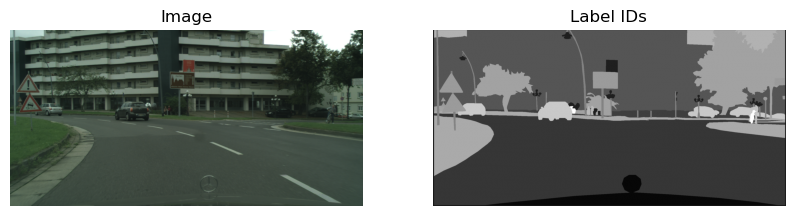

In [3]:
first_img_path = IMAGES_DIR / "train" / "aachen" / "aachen_000000_000019_leftImg8bit.png"
first_img_path_label = LABELS_DIR / "train" / "aachen" / "aachen_000000_000019_gtFine_labelIds.png"
first_img = Image.open(first_img_path)
first_img_label = Image.open(first_img_path_label)

fix, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(first_img)
ax[0].set_title('Image')
ax[1].imshow(first_img_label, cmap='gray', vmin=0, vmax=33)
ax[1].set_title('Label IDs')
ax[0].axis('off')
ax[1].axis('off')
plt.show()

# **INSPECTIONS**

In [4]:
print("label shape: ", np.array(first_img_label).shape, "img shape: ", np.array(first_img).shape)

# inspect the label
first_img_label_array = np.array(first_img_label)
print("Number of classes in first image: ", len(np.unique(first_img_label_array)), "\nClasses: ", np.unique(first_img_label_array))


label shape:  (1024, 2048) img shape:  (1024, 2048, 3)
Number of classes in first image:  16 
Classes:  [ 0  1  3  4  7  8 11 17 20 21 22 23 24 25 26 33]


# **CHANGING LABEL IDS**

In [5]:
# class mapping coding block
TRAIN_ID_MAP = {
    0: 255,  # unlabeled -> ignore
    1: 255,  # ego vehicle -> ignore
    2: 255,  # rectification border -> ignore
    3: 255,  # out of roi -> ignore
    4: 255,  # static -> ignore
    5: 255,  # dynamic -> ignore
    6: 255,  # ground -> ignore
    7: 0,    # road
    8: 1,    # sidewalk
    9: 255,  # parking -> ignore
    10: 255, # rail track -> ignore
    11: 2,   # building
    12: 3,   # wall
    13: 4,   # fence
    14: 255, # guard rail -> ignore
    15: 255, # bridge -> ignore
    16: 255, # tunnel -> ignore
    17: 5,   # pole
    18: 255, # polegroup -> ignore
    19: 6,   # traffic light
    20: 7,   # traffic sign
    21: 8,   # vegetation
    22: 9,   # terrain
    23: 10,  # sky
    24: 11,  # person
    25: 12,  # rider
    26: 13,  # car
    27: 14,  # truck
    28: 15,  # bus
    29: 255, # caravan -> ignore
    30: 255, # trailer -> ignore
    31: 16,  # train
    32: 17,  # motorcycle
    33: 18,  # bicycle
    -1: 255, # license plate -> ignore
}

# Training class names (19 classes)
TRAIN_CLASSES = [
    'road', 'sidewalk', 'building', 'wall', 'fence', 'pole',
    'traffic light', 'traffic sign', 'vegetation', 'terrain', 'sky',
    'person', 'rider', 'car', 'truck', 'bus', 'train', 'motorcycle', 'bicycle'
]

NUM_CLASSES = 19  # Standard Cityscapes training classes
IGNORE_INDEX = 255  # Label to ignore during training


In [6]:
def count_images(split):
    """Count images in a split across all cities."""
    img_dir = IMAGES_DIR / split
    if not img_dir.exists():
        return 0, []

    images = []
    for city_dir in sorted(img_dir.iterdir()):
        if city_dir.is_dir():
            images.extend(sorted(city_dir.glob("*_leftImg8bit.png")))
    return len(images), images


train_count, train_images = count_images('train')
val_count, val_images = count_images('val')
test_count, test_images = count_images('test')

print(f"Train: {train_count} images")
print(f"Val:   {val_count} images")
print(f"Test:  {test_count} images")
print(f"Total: {train_count + val_count + test_count} images")

Train: 2975 images
Val:   500 images
Test:  1525 images
Total: 5000 images


# **VISUALIZE DATASE**T

Image shape:  (1024, 2048, 3)
Image size: (2048, 1024)
Image mode: RGB

Label IDs size: (2048, 1024)
Label IDs mode: L

Label ID dtype: uint8
Label ID range: [0, 33]
Unique labels in this image: 16
Label values: [0, 1, 3, 4, 7, 8, 11, 17, 20, 21, 22, 23, 24, 25, 26, 33]


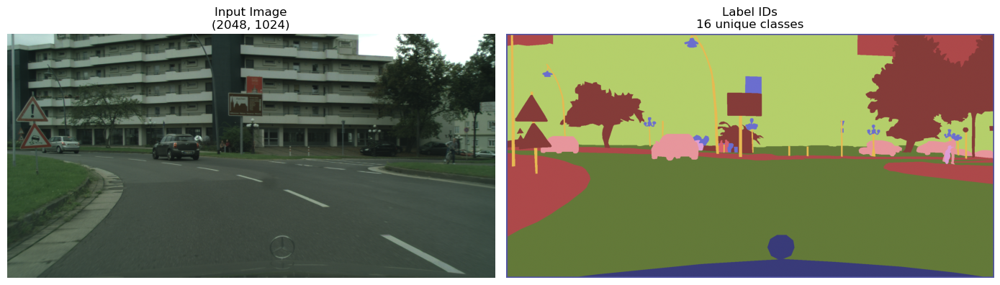

In [7]:
# opening first image and label
if train_images:
    sample_img_path = train_images[0]
    city = sample_img_path.parent.name
    base_name = sample_img_path.stem.replace('_leftImg8bit', '')

    sample_img = Image.open(sample_img_path)
    mask_ids = Image.open(LABELS_DIR / 'train' / city / (base_name + "_gtFine_labelIds.png"))

    print("Image shape: ", np.array(sample_img).shape)
    print(f"Image size: {sample_img.size}")
    print(f"Image mode: {sample_img.mode}")
    print(f"\nLabel IDs size: {mask_ids.size}")
    print(f"Label IDs mode: {mask_ids.mode}")

    # Analyze mask values
    mask_array = np.array(mask_ids)
    unique_masks = np.unique(mask_array)
    print(f"\nLabel ID dtype: {mask_array.dtype}")
    print(f"Label ID range: [{mask_array.min()}, {mask_array.max()}]")
    print(f"Unique labels in this image: {len(unique_masks)}")
    print(f"Label values: {unique_masks.tolist()}")

    # Visualize
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    axes[0].imshow(sample_img)
    axes[0].set_title(f"Input Image\n{sample_img.size}")
    axes[0].axis('off')

    axes[1].imshow(mask_array, cmap='tab20b')
    axes[1].set_title(f"Label IDs\n{len(unique_masks)} unique classes")
    axes[1].axis('off')


    plt.tight_layout()
    plt.show()

# **# 1. PyTorch DATASET CLAS**S

In [8]:
class CityscapesDataset(Dataset):
    """
    PyTorch Dataset for official Cityscapes format.
    
    Loads images from leftImg8bit/ and labels from gtFine/*_labelIds.png
    """
    
    def __init__(self, root_dir, split='train', img_size=(512, 256), 
                 use_train_ids=True, transform=None):
        """
        Args:
            root_dir: Path to Cityscapes root (contains leftImg8bit/ and gtFine/)
            split: 'train', 'val', or 'test'
            img_size: Tuple (width, height) for resizing
            use_train_ids: If True, map 34 classes to 19 training classes
            transform: Optional transforms for augmentation
        """
        self.root_dir = Path(root_dir)
        self.split = split
        self.img_width, self.img_height = img_size
        self.use_train_ids = use_train_ids
        self.transform = transform
        
        # Collect all image paths
        self.images = []
        self.labels = []
        
        img_dir = self.root_dir / "leftImg8bit" / split
        label_dir = self.root_dir / "gtFine" / split
        
        for city_dir in sorted(img_dir.iterdir()):
            if city_dir.is_dir():
                city = city_dir.name
                for img_path in sorted(city_dir.glob("*_leftImg8bit.png")):
                    base_name = img_path.stem.replace('_leftImg8bit', '')
                    label_path = label_dir / city / f"{base_name}_gtFine_labelIds.png"
                    
                    if label_path.exists():
                        self.images.append(img_path)
                        self.labels.append(label_path)
        
        print(f"  Found {len(self.images)} image-label pairs in {split}")
    
    def __len__(self):
        return len(self.images)
    
    def _map_to_train_ids(self, label):
        """Map original label IDs (0-33) to training IDs (0-18, 255=ignore)"""
        label_copy = label.copy()
        for orig_id, train_id in TRAIN_ID_MAP.items():
            label_copy[label == orig_id] = train_id
        return label_copy
    
    def __getitem__(self, idx):
        # Load image
        img = Image.open(self.images[idx]).convert('RGB')
        
        # Load label (as single channel)
        label = Image.open(self.labels[idx])
        
        # Resize
        img = img.resize((self.img_width, self.img_height), Image.BILINEAR)
        label = label.resize((self.img_width, self.img_height), Image.NEAREST)
        
        # Convert to numpy
        img_array = np.array(img)
        label_array = np.array(label, dtype=np.int64)
        
        # Map to training IDs if requested
        if self.use_train_ids:
            label_array = self._map_to_train_ids(label_array)
        
        # Apply transforms (if any)
        if self.transform:
            augmented = self.transform(image=img_array, mask=label_array)
            img_array = augmented["image"]
            label_array = augmented["mask"]
        
        # Convert to tensor
        if isinstance(img_array, np.ndarray):
            img_tensor = torch.from_numpy(img_array).permute(2,0,1).float() / 255.0
        else:
            img_tensor = img_array.float()
        
        if isinstance(label_array, np.ndarray):
            label_tensor = torch.from_numpy(label_array).long()
        else:
            label_tensor = label_array.long()
        
        return img_tensor, label_tensor

###  Ideas:
1. function to measure resizing error + put metrics after resizing to put on final paper + a bit of bibliography research if needed for SSIM and other metrics
2. try inference on validation and validation set in higher resolution

In [9]:
# Count cores
num_cores = os.cpu_count()
print(f"CPU cores: {num_cores}")

if platform.system() == 'Windows':
    print("Windows detected")
    NUM_WORKERS = 0  # or 1
else:
    print("Linux/Mac detected")
    NUM_WORKERS = 4  # Linux/Mac

CPU cores: 20
Linux/Mac detected


# **TRANSFORMATIONS: USED IMAGENET MEAN AND STD**

In [10]:
train_tf = A.Compose([
    # --- Spatial augmentations (applied to both image AND mask) ---
    A.HorizontalFlip(p=0.1),

    # Multi-scale training: randomly resize, pad if too small, then crop back
    A.RandomScale(scale_limit=0.3, p=0.5),           # scale between 0.7x and 1.3x
    A.PadIfNeeded(min_height=256, min_width=512,      # ensure enough pixels for crop
                  border_mode=0, value=0,             # zero-pad
                  mask_value=255, p=1.0),             # 255 = ignore index for padded mask
    A.RandomCrop(height=256, width=512, p=1.0),       # crop to target size

    A.ShiftScaleRotate(
        shift_limit=0.05,                             # small translation
        scale_limit=0.0,                              # scale already handled above
        rotate_limit=10,                              # mild rotation — streets have a horizon
        border_mode=0,
        p=0.3
    ),

    # --- Color augmentations (image only, mask untouched) ---
    A.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.2,
        hue=0.1,
        p=0.5
    ),
    A.GaussianBlur(blur_limit=(3, 5), p=0.2),

    # --- Normalization + tensor conversion ---
    A.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
    ToTensorV2()
])

val_tf = A.Compose([
    A.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
    ToTensorV2()
])

/tmp/ipykernel_85614/3720621725.py:7: UserWarning: Argument(s) 'value, mask_value' are not valid for transform PadIfNeeded
  A.PadIfNeeded(min_height=256, min_width=512,      # ensure enough pixels for crop
/home/johnh/miniconda3/envs/nyuv2_env/lib/python3.11/site-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


# **CREATING LOADER**S

In [11]:
# Configuration
IMG_SIZE = (512, 256)  # (width, height) - Cityscapes aspect ratio
BATCH_SIZE = 4    # big

train_dataset = CityscapesDataset(CITYSCAPES_ROOT, split='train', img_size=IMG_SIZE, transform=train_tf, use_train_ids=True)
val_dataset = CityscapesDataset(CITYSCAPES_ROOT, split='val', img_size=IMG_SIZE, transform=val_tf, use_train_ids=True)
test_dataset = CityscapesDataset(CITYSCAPES_ROOT, split='test', img_size=IMG_SIZE, transform=val_tf, use_train_ids=True)

# Create dataloaders
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

# set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}\n")

print("DATASET SUMMARY")
print("=" * 60)
print(f"Image size: {IMG_SIZE[0]} x {IMG_SIZE[1]} (W x H)")
print(f"Batch size: {BATCH_SIZE}")
print(f"Number of classes: {NUM_CLASSES}")
print(f"\nTrain: {len(train_dataset)} images, {len(train_loader)} batches")
print(f"\nVal:   {len(val_dataset)} images, {len(val_loader)} batches")
print(f"\nTest:  {len(test_dataset)} images, {len(test_loader)} batches")

  Found 2975 image-label pairs in train
  Found 500 image-label pairs in val
  Found 1525 image-label pairs in test
Using device: cuda

DATASET SUMMARY
Image size: 512 x 256 (W x H)
Batch size: 4
Number of classes: 19

Train: 2975 images, 744 batches

Val:   500 images, 125 batches

Test:  1525 images, 382 batches


In [12]:
## tests on shapes
img, mask = train_dataset[0]

print(img.shape)        # [3, H, W]
print(img.dtype)       # torch.float32
print(mask.shape)      # [H, W]
print(mask.dtype)      # torch.int64
print(torch.unique(mask))


torch.Size([3, 256, 512])
torch.float32
torch.Size([256, 512])
torch.int64
tensor([  0,   1,   2,   5,   7,   8,   9,  10,  11,  12,  13,  18, 255])


In [13]:
img, label = train_loader.dataset[0]
print(img.shape)
print(label.shape)

torch.Size([3, 256, 512])
torch.Size([256, 512])


# **CALCULATE CLASS WEIGHTS**

In [14]:
# Function to calculate the weights of classes
# Classes are very unbalance, so we need to pass
# the weights to loss funcation
def calculate_classes_weights(dataloader, num_classes=19, ignore_index=255):
    counts = torch.zeros(num_classes)

    for _, mask in tqdm(dataloader):

        mask = mask.view(-1)
        mask = mask[mask != ignore_index]

        # Count number of pixels of each class
        counts += torch.bincount(mask, minlength=num_classes).cpu()

    # Calculate weights: 1 / (frequency)
    # We add a small epsilon (1e-6) to avoid division by zero
    weights = 1.0 / (counts + 1e-8)

    # Normalize weights so the average weight is 1.0
    weights = weights / weights.sum() * num_classes

    return weights

# Calculation takes much time. We calculate the weights once and then we assign them statically.
# Uncomment next line to calculate the weights

# class_weights = calculate_classes_weights(train_loader)

class_weights =  torch.tensor([0.0115, 0.0699, 0.0187, 0.6487, 0.4847, 0.3464, 2.0487, 0.7712, 0.0268,
        0.3674, 0.1073, 0.3480, 3.1351, 0.0607, 1.5869, 1.8060, 1.8242, 4.3118,
        1.0262]).to(device)

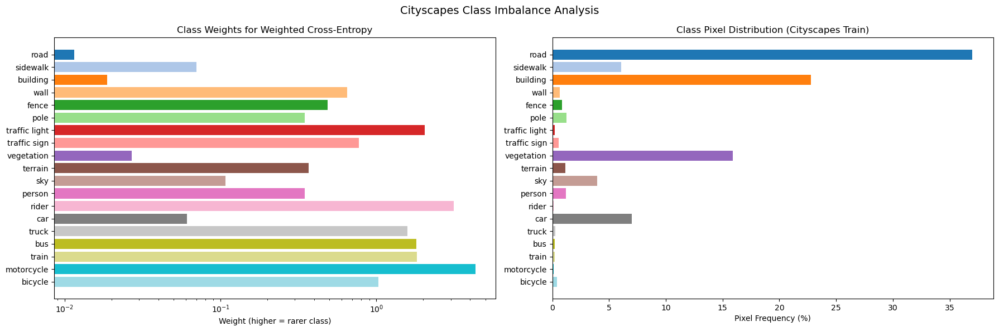

In [15]:
# --- Class Distribution & Weights Visualization ---
import matplotlib.pyplot as plt
import numpy as np

class_names_cs = [
    'road', 'sidewalk', 'building', 'wall', 'fence',
    'pole', 'traffic light', 'traffic sign', 'vegetation', 'terrain',
    'sky', 'person', 'rider', 'car', 'truck',
    'bus', 'train', 'motorcycle', 'bicycle'
]

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Bar chart of class weights (log scale since they vary hugely)
weights_np = class_weights.cpu().numpy()
colors = plt.cm.tab20(np.linspace(0, 1, len(class_names_cs)))

axes[0].barh(class_names_cs, weights_np, color=colors)
axes[0].set_xlabel('Weight (higher = rarer class)')
axes[0].set_title('Class Weights for Weighted Cross-Entropy')
axes[0].set_xscale('log')
axes[0].invert_yaxis()

# Relative frequency (1/weight normalized)
freq = 1.0 / (weights_np + 1e-8)
freq = freq / freq.sum() * 100
axes[1].barh(class_names_cs, freq, color=colors)
axes[1].set_xlabel('Pixel Frequency (%)')
axes[1].set_title('Class Pixel Distribution (Cityscapes Train)')
axes[1].invert_yaxis()

plt.suptitle('Cityscapes Class Imbalance Analysis', fontsize=14)
plt.tight_layout()
plt.savefig(str(DATA_PATH / 'MachineLearning' / 'experiments' / 'class_distribution.png'), dpi=150, bbox_inches='tight')
plt.show()


In [16]:
images, labels = next(iter(train_loader))
images.shape, labels.shape

(torch.Size([4, 3, 256, 512]), torch.Size([4, 256, 512]))

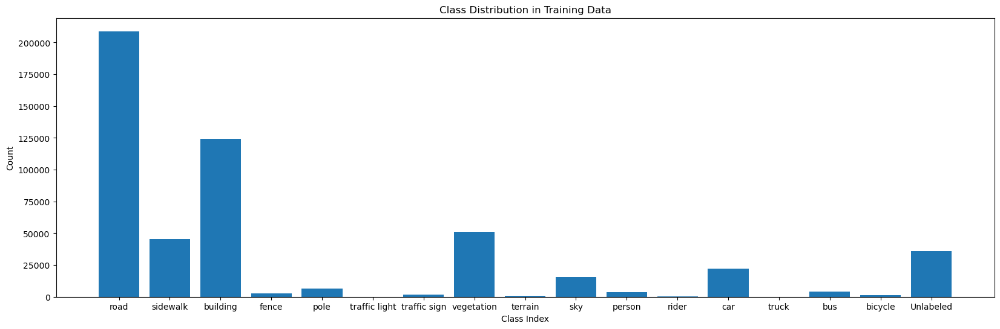

In [17]:
unique_labels, counts = torch.unique(labels, return_counts=True)

unique_labels_np = unique_labels.cpu().numpy()
counts_np = counts.cpu().numpy()

plot_labels = []
for label in unique_labels_np:
    if label == 255:
        plot_labels.append('Unlabeled')
    else:
        plot_labels.append(TRAIN_CLASSES[label])

plt.figure(figsize=(20, 6))
plt.bar(plot_labels, counts_np)
plt.xlabel('Class Index')
plt.ylabel('Count')
plt.title('Class Distribution in Training Data')
plt.show()

### Add more code to visualize and see stats of class distribution

# 2. U-Net Architecture From Scratch (but different padding than OG(2015) paper)

In [18]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),

            nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )

    def forward(self, x):
        return self.conv(x)


class DownSample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = DoubleConv(in_channels, out_channels)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

    def forward(self, x):
        down = self.conv(x)
        p = self.pool(down)
        return down, p


class UpSample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.up = nn.ConvTranspose2d(in_channels, in_channels//2, kernel_size=2, stride=2) #or bilinear interpolation upsampling
        self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2): # in forward pass x1 is the upsampled image and x2 is the skip connection from the encoder
        x1 = self.up(x1)       # could add safety checks for size differences
        x = torch.cat([x1, x2], 1)
        x = self.conv(x)
        return x


class UNET(nn.Module):
    def __init__(self, in_channels, num_classes):
        super().__init__()
        self.down_convolution_1 = DownSample(in_channels, 64)
        self.down_convolution_2 = DownSample(64, 128)
        self.down_convolution_3 = DownSample(128, 256)
        self.down_convolution_4 = DownSample(256, 512)

        self.bottle_neck = DoubleConv(512, 1024)

        self.up_convolution_1 = UpSample(1024, 512)
        self.up_convolution_2 = UpSample(512, 256)
        self.up_convolution_3 = UpSample(256, 128)
        self.up_convolution_4 = UpSample(128, 64)

        self.out = nn.Conv2d(in_channels=64, out_channels=num_classes, kernel_size=1)

    def forward(self, x):
        down_1, p1 = self.down_convolution_1(x)
        down_2, p2 = self.down_convolution_2(p1)
        down_3, p3 = self.down_convolution_3(p2)
        down_4, p4 = self.down_convolution_4(p3)

        b = self.bottle_neck(p4)

        up_1 = self.up_convolution_1(b, down_4)
        up_2 = self.up_convolution_2(up_1, down_3)
        up_3 = self.up_convolution_3(up_2, down_2)
        up_4 = self.up_convolution_4(up_3, down_1)

        out = self.out(up_4)
        return out

# 3. Training loop

In [19]:
# Base experiments directory (all weights will live under this)
EXPERIMENTS_DIR = DATA_PATH / "MachineLearning" / "experiments"
EXPERIMENTS_DIR.mkdir(parents=True, exist_ok=True)

def get_weights_dir(model_name):
    """Return the weights directory for a given model/experiment."""
    safe_name = str(model_name).replace(' ', '_').replace('(', '').replace(')', '')
    weights_dir = EXPERIMENTS_DIR / safe_name / "weights"
    weights_dir.mkdir(parents=True, exist_ok=True)
    return weights_dir

# Example path
print(get_weights_dir('SegFormer_CE'))

/mnt/c/Users/johnh/Desktop/simantik/METAPTYXIAKO assignments/MachineLearning/experiments/SegFormer_CE/weights


In [20]:
# device is already set in the dataloader cell above
# Re-confirm it here for safety
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}\n')


Using device: cuda



In [21]:
sys.path.append(os.path.abspath('..'))  # Adjust path if needed
from src.metrics import IoUMetric, DiceScoreMetric

In [22]:
class SegFormer(nn.Module):
    def __init__(self, num_classes, config={}, pretrained_model_name="nvidia/mit-b0"):
        super().__init__()

        if not config:
            # Fine-tuning
            self.model = SegformerForSemanticSegmentation.from_pretrained(
                pretrained_model_name,
                num_labels=num_classes,
                ignore_mismatched_sizes=True
            )
        else:
            # Training from scratch
            self.model = SegformerForSemanticSegmentation(config)

    def forward(self, x):
        # Segformer expects pixel_values argument
        outputs = self.model(pixel_values=x)
        logits = outputs.logits

        # Upsample logits to match input image size (B, C, H, W)
        upsampled_logits = nn.functional.interpolate(
            logits,
            size=x.shape[2:],
            mode='bilinear',
            align_corners=False
        )
        return upsampled_logits

In [23]:
def train_epoch(model, loader, optimizer, criterion, device, scheduler=None, metrics=None):
    model.train()
    running_loss = 0.0

    # Reset metrics at start of epoch
    if metrics:
        if not isinstance(metrics, list): metrics = [metrics]
        for m in metrics:
            m.reset()

    # Wrap loader in tqdm for the progress bar
    pbar = tqdm(loader, desc="Training", leave=False)

    for images, labels in pbar:

        images = images.to(device)
        labels = labels.to(device)

        # forward pass
        outputs = model(images)
        loss = criterion(outputs, labels)

        # backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Step scheduler
        if scheduler:
            scheduler.step()

        running_loss += loss.item()

        # Update metrics (using detach() to save memory)
        if metrics:
            with torch.no_grad():
                for m in metrics:
                    m.update(outputs.detach(), labels.detach())

        # Update progress bar description with current loss
        pbar.set_postfix({'loss': f"{loss.item():.4f}"})

    epochs_loss = running_loss / len(loader)

    # Compute final metrics
    metric_results = {}
    if metrics:
        for m in metrics:
            # Use class name or a custom name key
            metric_results[m.__class__.__name__] = m.compute()

    return epochs_loss, metric_results

In [24]:
def validate_epoch(model, loader, criterion, device, metrics=None):
    model.eval()
    running_loss = 0.0

    # Reset metrics
    if metrics:
        if not isinstance(metrics, list): metrics = [metrics]
        for m in metrics:
            m.reset()

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Validation", leave=False):

            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item()

            # Update metrics
            if metrics:
                for m in metrics:
                    m.update(outputs, labels)

    epoch_loss = running_loss / len(loader)

    # Compute metrics
    metric_results = {}
    if metrics:
        for m in metrics:
            metric_results[m.__class__.__name__] = m.compute()

    return epoch_loss, metric_results

In [25]:
class DiceLoss(nn.Module):
    """Soft Dice Loss for multi-class segmentation with ignore_index support."""
    def __init__(self, num_classes, ignore_index=255, smooth=1e-5):
        super().__init__()
        self.num_classes = num_classes
        self.ignore_index = ignore_index
        self.smooth = smooth

    def forward(self, logits, targets):
        # logits: (N, C, H, W), targets: (N, H, W)
        probs = F.softmax(logits, dim=1)

        # Handle ignore_index by masking
        mask = (targets != self.ignore_index).unsqueeze(1)
        targets_clamped = targets.clone()
        targets_clamped[targets == self.ignore_index] = 0

        onehot = F.one_hot(targets_clamped, num_classes=self.num_classes).permute(0, 3, 1, 2).float()
        probs = probs * mask
        onehot = onehot * mask

        dims = (0, 2, 3)
        intersection = (probs * onehot).sum(dims)
        denom = probs.sum(dims) + onehot.sum(dims)
        dice = (2.0 * intersection + self.smooth) / (denom + self.smooth)

        return 1.0 - dice.mean()


In [26]:
# --- Loss functions to compare ---
# CE is the baseline; Weighted-CE helps with class imbalance.
# DiceLoss is a separate alternative (no combination).
dice_loss = DiceLoss(num_classes=NUM_CLASSES, ignore_index=IGNORE_INDEX)

LOSSES = {
    'CE':          nn.CrossEntropyLoss(ignore_index=IGNORE_INDEX),
    'Weighted-CE': nn.CrossEntropyLoss(weight=class_weights.to(device), ignore_index=IGNORE_INDEX),
    'Dice':        dice_loss,
}

# --- Architectures ---
ARCHITECTURES = {
    'UNet':     lambda: UNET(in_channels=3, num_classes=NUM_CLASSES),
    'SegFormer': lambda: SegFormer(num_classes=NUM_CLASSES, config={}, pretrained_model_name="nvidia/mit-b0"),
}

ARCH_TO_LR = {
    'UNet': 4e-4,
    'SegFormer': 1e-5,
}

NUM_EPOCHS = 15


In [28]:
# === Main Training Loop: 4 experiments ===
# UNet (CE), UNet (Weighted-CE), SegFormer (CE), SegFormer (Weighted-CE)

PATIENCE = 5  # early stopping patience

# Only use CE and Weighted-CE for the main grid
LOSS_GRID = {k: v for k, v in LOSSES.items() if k in ('CE', 'Weighted-CE')}

model_results = []
histories = {}
models = {}

for arch_name, arch_fn in ARCHITECTURES.items():
    for loss_name, criterion in LOSS_GRID.items():
        exp_name = f'{arch_name} ({loss_name})'
        print(f'\n{"=" * 50}')
        print(f'Training: {exp_name}')
        print(f'{"=" * 50}')

        model = arch_fn().to(device)
        lr = ARCH_TO_LR.get(arch_name, 1e-4)
        optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-4)
        scheduler = optim.lr_scheduler.OneCycleLR(
            optimizer, max_lr=max(lr, 8e-3) if arch_name == 'UNet' else lr * 10,
            steps_per_epoch=len(train_loader), epochs=NUM_EPOCHS
        )

        # Use unweighted CE for validation (fair comparison)
        val_criterion = nn.CrossEntropyLoss(ignore_index=IGNORE_INDEX)

        history = {'train_loss': [], 'val_loss': [], 'val_miou': [], 'val_dice': []}
        best_miou = 0.0
        patience_counter = 0

        for epoch in range(NUM_EPOCHS):
            train_metrics_list = [
                IoUMetric(NUM_CLASSES, ignore_index=255),
                DiceScoreMetric(NUM_CLASSES, ignore_index=255)
            ]
            val_metrics_list = [
                IoUMetric(NUM_CLASSES, ignore_index=255),
                DiceScoreMetric(NUM_CLASSES, ignore_index=255)
            ]

            train_loss, train_m = train_epoch(
                model, train_loader, optimizer, criterion, device,
                scheduler=scheduler, metrics=train_metrics_list
            )
            val_loss, val_m = validate_epoch(
                model, val_loader, val_criterion, device, metrics=val_metrics_list
            )

            history['train_loss'].append(train_loss)
            history['val_loss'].append(val_loss)
            history['val_miou'].append(val_m['IoUMetric'])
            history['val_dice'].append(val_m['DiceScoreMetric'])

            print(f'Epoch {epoch+1}/{NUM_EPOCHS} | {exp_name} | '
                  f'Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | '
                  f'mIoU: {val_m["IoUMetric"]:.4f} | Dice: {val_m["DiceScoreMetric"]:.4f}')

            # Save best model + early stopping
            if val_m['IoUMetric'] > best_miou:
                best_miou = val_m['IoUMetric']
                patience_counter = 0
                weights_dir = get_weights_dir(exp_name)
                torch.save(model.state_dict(), str(weights_dir / 'best_model.pth'))
            else:
                patience_counter += 1
                if patience_counter >= PATIENCE:
                    print(f'Early stopping at epoch {epoch+1} (patience={PATIENCE})')
                    break

        models[exp_name] = model
        histories[exp_name] = history
        model_results.append({
            'Model': exp_name,
            'Best mIoU': best_miou,
            'Final Train Loss': history['train_loss'][-1],
            'Final Val Loss': history['val_loss'][-1],
        })

print('\nAll training complete!')



Training: UNet (CE)


Epoch 1/15 | UNet (CE) | Train Loss: 0.9988 | Val Loss: 0.7969 | mIoU: 0.1896 | Dice: 0.2365


Epoch 2/15 | UNet (CE) | Train Loss: 0.7081 | Val Loss: 0.7554 | mIoU: 0.1958 | Dice: 0.2436


Epoch 3/15 | UNet (CE) | Train Loss: 0.6170 | Val Loss: 0.7127 | mIoU: 0.2130 | Dice: 0.2616


Epoch 4/15 | UNet (CE) | Train Loss: 0.5568 | Val Loss: 0.5906 | mIoU: 0.2433 | Dice: 0.2974


Epoch 5/15 | UNet (CE) | Train Loss: 0.5060 | Val Loss: 0.5893 | mIoU: 0.2421 | Dice: 0.2976


Epoch 6/15 | UNet (CE) | Train Loss: 0.4689 | Val Loss: 0.5407 | mIoU: 0.2675 | Dice: 0.3246


Epoch 7/15 | UNet (CE) | Train Loss: 0.4324 | Val Loss: 0.4613 | mIoU: 0.2912 | Dice: 0.3511


Epoch 8/15 | UNet (CE) | Train Loss: 0.4079 | Val Loss: 0.4172 | mIoU: 0.3147 | Dice: 0.3800


Epoch 9/15 | UNet (CE) | Train Loss: 0.3750 | Val Loss: 0.4738 | mIoU: 0.3023 | Dice: 0.3648


Epoch 10/15 | UNet (CE) | Train Loss: 0.3509 | Val Loss: 0.4048 | mIoU: 0.3151 | Dice: 0.3824


Epoch 11/15 | UNet (CE) | Train Loss: 0.3238 | Val Loss: 0.3561 | mIoU: 0.3478 | Dice: 0.4253


Epoch 12/15 | UNet (CE) | Train Loss: 0.3014 | Val Loss: 0.3325 | mIoU: 0.3747 | Dice: 0.4620


Epoch 13/15 | UNet (CE) | Train Loss: 0.2803 | Val Loss: 0.3145 | mIoU: 0.4040 | Dice: 0.5020


Epoch 14/15 | UNet (CE) | Train Loss: 0.2659 | Val Loss: 0.3037 | mIoU: 0.4078 | Dice: 0.5058


Epoch 15/15 | UNet (CE) | Train Loss: 0.2587 | Val Loss: 0.3019 | mIoU: 0.4101 | Dice: 0.5087

Training: UNet (Weighted-CE)


Epoch 1/15 | UNet (Weighted-CE) | Train Loss: 2.1870 | Val Loss: 1.9274 | mIoU: 0.1273 | Dice: 0.1848


Epoch 2/15 | UNet (Weighted-CE) | Train Loss: 1.9462 | Val Loss: 1.4350 | mIoU: 0.1668 | Dice: 0.2424


Epoch 3/15 | UNet (Weighted-CE) | Train Loss: 1.8908 | Val Loss: 1.5318 | mIoU: 0.1409 | Dice: 0.2141


Epoch 4/15 | UNet (Weighted-CE) | Train Loss: 1.8124 | Val Loss: 1.4138 | mIoU: 0.1677 | Dice: 0.2340


Epoch 5/15 | UNet (Weighted-CE) | Train Loss: 1.7371 | Val Loss: 1.2207 | mIoU: 0.1988 | Dice: 0.2804


Epoch 6/15 | UNet (Weighted-CE) | Train Loss: 1.6645 | Val Loss: 1.2303 | mIoU: 0.2033 | Dice: 0.2865


Epoch 7/15 | UNet (Weighted-CE) | Train Loss: 1.5944 | Val Loss: 1.5339 | mIoU: 0.1866 | Dice: 0.2672


Epoch 8/15 | UNet (Weighted-CE) | Train Loss: 1.5171 | Val Loss: 1.0264 | mIoU: 0.2418 | Dice: 0.3342


Epoch 9/15 | UNet (Weighted-CE) | Train Loss: 1.4490 | Val Loss: 1.1630 | mIoU: 0.2279 | Dice: 0.3236


Epoch 10/15 | UNet (Weighted-CE) | Train Loss: 1.3469 | Val Loss: 0.9556 | mIoU: 0.2726 | Dice: 0.3701


Epoch 11/15 | UNet (Weighted-CE) | Train Loss: 1.2701 | Val Loss: 0.9024 | mIoU: 0.2872 | Dice: 0.3925


Epoch 12/15 | UNet (Weighted-CE) | Train Loss: 1.1914 | Val Loss: 0.9775 | mIoU: 0.2669 | Dice: 0.3631


Epoch 13/15 | UNet (Weighted-CE) | Train Loss: 1.1158 | Val Loss: 0.7984 | mIoU: 0.3085 | Dice: 0.4193


Epoch 14/15 | UNet (Weighted-CE) | Train Loss: 1.0612 | Val Loss: 0.7613 | mIoU: 0.3185 | Dice: 0.4300


Epoch 15/15 | UNet (Weighted-CE) | Train Loss: 1.0379 | Val Loss: 0.7623 | mIoU: 0.3185 | Dice: 0.4302

Training: SegFormer (CE)


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head.batch_norm.bias', 'decode_head.batch_norm.num_batches_tracked', 'decode_head.batch_norm.running_mean', 'decode_head.batch_norm.running_var', 'decode_head.batch_norm.weight', 'decode_head.classifier.bias', 'decode_head.classifier.weight', 'decode_head.linear_c.0.proj.bias', 'decode_head.linear_c.0.proj.weight', 'decode_head.linear_c.1.proj.bias', 'decode_head.linear_c.1.proj.weight', 'decode_head.linear_c.2.proj.bias', 'decode_head.linear_c.2.proj.weight', 'decode_head.linear_c.3.proj.bias', 'decode_head.linear_c.3.proj.weight', 'decode_head.linear_fuse.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/15 | SegFormer (CE) | Train Loss: 1.7398 | Val Loss: 1.0045 | mIoU: 0.2165 | Dice: 0.2534


Epoch 2/15 | SegFormer (CE) | Train Loss: 0.7502 | Val Loss: 0.5401 | mIoU: 0.2756 | Dice: 0.3242


Epoch 3/15 | SegFormer (CE) | Train Loss: 0.4496 | Val Loss: 0.4003 | mIoU: 0.3401 | Dice: 0.4079


Epoch 4/15 | SegFormer (CE) | Train Loss: 0.3613 | Val Loss: 0.3429 | mIoU: 0.3893 | Dice: 0.4771


Epoch 5/15 | SegFormer (CE) | Train Loss: 0.3097 | Val Loss: 0.3169 | mIoU: 0.4214 | Dice: 0.5204


Epoch 6/15 | SegFormer (CE) | Train Loss: 0.2812 | Val Loss: 0.2830 | mIoU: 0.4798 | Dice: 0.5984


Epoch 7/15 | SegFormer (CE) | Train Loss: 0.2611 | Val Loss: 0.2796 | mIoU: 0.4974 | Dice: 0.6237


Epoch 8/15 | SegFormer (CE) | Train Loss: 0.2450 | Val Loss: 0.2637 | mIoU: 0.5175 | Dice: 0.6464


Epoch 9/15 | SegFormer (CE) | Train Loss: 0.2291 | Val Loss: 0.2609 | mIoU: 0.5266 | Dice: 0.6513


Epoch 10/15 | SegFormer (CE) | Train Loss: 0.2195 | Val Loss: 0.2525 | mIoU: 0.5306 | Dice: 0.6567


Epoch 11/15 | SegFormer (CE) | Train Loss: 0.2117 | Val Loss: 0.2505 | mIoU: 0.5566 | Dice: 0.6858


Epoch 12/15 | SegFormer (CE) | Train Loss: 0.2060 | Val Loss: 0.2444 | mIoU: 0.5639 | Dice: 0.6928


Epoch 13/15 | SegFormer (CE) | Train Loss: 0.2011 | Val Loss: 0.2417 | mIoU: 0.5663 | Dice: 0.6942


Epoch 14/15 | SegFormer (CE) | Train Loss: 0.1968 | Val Loss: 0.2412 | mIoU: 0.5703 | Dice: 0.6984


Epoch 15/15 | SegFormer (CE) | Train Loss: 0.1968 | Val Loss: 0.2410 | mIoU: 0.5700 | Dice: 0.6984

Training: SegFormer (Weighted-CE)


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head.batch_norm.bias', 'decode_head.batch_norm.num_batches_tracked', 'decode_head.batch_norm.running_mean', 'decode_head.batch_norm.running_var', 'decode_head.batch_norm.weight', 'decode_head.classifier.bias', 'decode_head.classifier.weight', 'decode_head.linear_c.0.proj.bias', 'decode_head.linear_c.0.proj.weight', 'decode_head.linear_c.1.proj.bias', 'decode_head.linear_c.1.proj.weight', 'decode_head.linear_c.2.proj.bias', 'decode_head.linear_c.2.proj.weight', 'decode_head.linear_c.3.proj.bias', 'decode_head.linear_c.3.proj.weight', 'decode_head.linear_fuse.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/15 | SegFormer (Weighted-CE) | Train Loss: 2.5599 | Val Loss: 2.1297 | mIoU: 0.2355 | Dice: 0.3366


Epoch 2/15 | SegFormer (Weighted-CE) | Train Loss: 1.6215 | Val Loss: 1.2745 | mIoU: 0.3333 | Dice: 0.4554


Epoch 3/15 | SegFormer (Weighted-CE) | Train Loss: 1.1577 | Val Loss: 0.7973 | mIoU: 0.3913 | Dice: 0.5238


Epoch 4/15 | SegFormer (Weighted-CE) | Train Loss: 0.9652 | Val Loss: 0.7524 | mIoU: 0.3631 | Dice: 0.4851


Epoch 5/15 | SegFormer (Weighted-CE) | Train Loss: 0.8767 | Val Loss: 0.6609 | mIoU: 0.3887 | Dice: 0.5118


Epoch 6/15 | SegFormer (Weighted-CE) | Train Loss: 0.8005 | Val Loss: 0.6264 | mIoU: 0.4040 | Dice: 0.5327


Epoch 7/15 | SegFormer (Weighted-CE) | Train Loss: 0.7407 | Val Loss: 0.6197 | mIoU: 0.4033 | Dice: 0.5310


Epoch 8/15 | SegFormer (Weighted-CE) | Train Loss: 0.7004 | Val Loss: 0.5691 | mIoU: 0.4178 | Dice: 0.5490


Epoch 9/15 | SegFormer (Weighted-CE) | Train Loss: 0.6484 | Val Loss: 0.5351 | mIoU: 0.4335 | Dice: 0.5660


Epoch 10/15 | SegFormer (Weighted-CE) | Train Loss: 0.6180 | Val Loss: 0.5416 | mIoU: 0.4339 | Dice: 0.5681


Epoch 11/15 | SegFormer (Weighted-CE) | Train Loss: 0.5879 | Val Loss: 0.4964 | mIoU: 0.4596 | Dice: 0.5941


Epoch 12/15 | SegFormer (Weighted-CE) | Train Loss: 0.5676 | Val Loss: 0.5070 | mIoU: 0.4571 | Dice: 0.5919


Epoch 13/15 | SegFormer (Weighted-CE) | Train Loss: 0.5483 | Val Loss: 0.4779 | mIoU: 0.4703 | Dice: 0.6054


Epoch 14/15 | SegFormer (Weighted-CE) | Train Loss: 0.5394 | Val Loss: 0.4766 | mIoU: 0.4719 | Dice: 0.6081


Epoch 15/15 | SegFormer (Weighted-CE) | Train Loss: 0.5300 | Val Loss: 0.4808 | mIoU: 0.4705 | Dice: 0.6062

All training complete!


In [29]:
for model_name, model in models.items():
    weights_dir = get_weights_dir(model_name)
    torch.save(model.state_dict(), str(weights_dir / 'final_model.pt'))

In [30]:
# # ============================================================
# # LOAD SAVED MODELS (uncomment this cell to skip training)
# # ============================================================
# # If you already trained and just want to load the weights,
# # comment out the training loop cell above and uncomment this.
# 
# models = {}
# histories = {}   # will be empty — no training curves available
# model_results = []  # will be empty — no training stats available
# 
# EXPERIMENT_NAMES = {
#     'UNet (CE)':              lambda: UNET(in_channels=3, num_classes=NUM_CLASSES),
#     'UNet (Weighted-CE)':     lambda: UNET(in_channels=3, num_classes=NUM_CLASSES),
#     'SegFormer (CE)':         lambda: SegFormer(num_classes=NUM_CLASSES, config={}, pretrained_model_name='nvidia/mit-b0'),
#     'SegFormer (Weighted-CE)':lambda: SegFormer(num_classes=NUM_CLASSES, config={}, pretrained_model_name='nvidia/mit-b0'),
# }
# 
# for exp_name, model_fn in EXPERIMENT_NAMES.items():
#     model = model_fn()
#     weights_path = get_weights_dir(exp_name) / 'best_model.pth'
#     if weights_path.exists():
#         model.load_state_dict(torch.load(str(weights_path), map_location=device))
#         print(f'Loaded: {exp_name} from {weights_path}')
#     else:
#         print(f'WARNING: {weights_path} not found — skipping {exp_name}')
#         continue
#     model = model.to(device)
#     model.eval()
#     models[exp_name] = model
# 
# print(f'\nLoaded {len(models)} models: {list(models.keys())}')



--- Summary Table ---
                     Model  Best mIoU  Final Train Loss  Final Val Loss
0                UNet (CE)   0.410066          0.258688        0.301895
1       UNet (Weighted-CE)   0.318534          1.037873        0.762337
2           SegFormer (CE)   0.570289          0.196797        0.241024
3  SegFormer (Weighted-CE)   0.471863          0.530039        0.480849


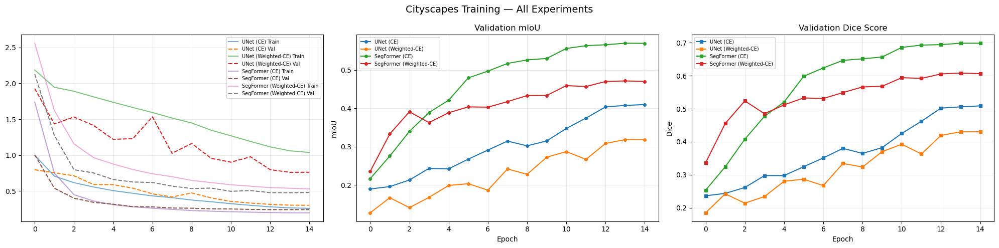

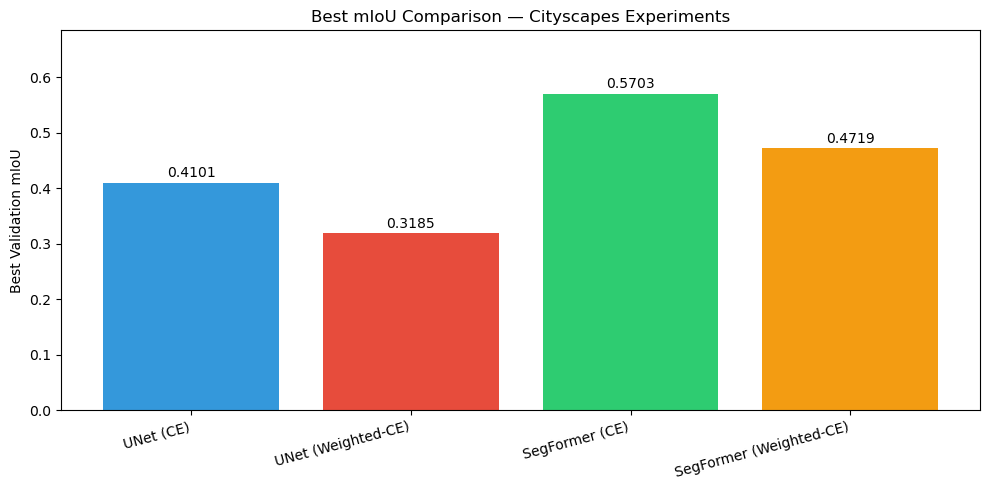

In [31]:
# Summary Dictionary to DataFrame
# If you loaded models from disk (skipped training), model_results and histories are missing.
# Build model_results by running validation for each loaded model.
try:
    _has_results = len(model_results) > 0
except NameError:
    _has_results = False
if not _has_results and 'models' in dir() and models:
    from src.metrics import IoUMetric, DiceScoreMetric
    _ce_crit = nn.CrossEntropyLoss(ignore_index=IGNORE_INDEX)
    model_results = []
    for _name, _model in models.items():
        _iou_m = IoUMetric(NUM_CLASSES, ignore_index=IGNORE_INDEX)
        _dice_m = DiceScoreMetric(NUM_CLASSES, ignore_index=IGNORE_INDEX)
        _, _val_m = validate_epoch(_model, val_loader, _ce_crit, device, metrics=[_iou_m, _dice_m])
        model_results.append({
            'Model': _name,
            'Best mIoU': _val_m['IoUMetric'],
            'Final Train Loss': float('nan'),
            'Final Val Loss': float('nan'),
        })
    print('(Computed model_results from loaded models — no training curves.)')
try:
    _ = histories
except NameError:
    histories = {}

df_res = pd.DataFrame(model_results)
print('\n--- Summary Table ---')
print(df_res)

# === Training Curves: Loss, mIoU, Dice ===
fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# Loss curves
for name, hist in histories.items():
    axes[0].plot(hist['train_loss'], label=f'{name} Train', alpha=0.6)
    axes[0].plot(hist['val_loss'], label=f'{name} Val', linestyle='--')
axes[0].legend(fontsize=7)
axes[0].grid(True, alpha=0.3)

# mIoU curves
for name, hist in histories.items():
    axes[1].plot(hist['val_miou'], label=name, marker='o', markersize=4)
axes[1].set_title('Validation mIoU')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('mIoU')
axes[1].legend(fontsize=7)
axes[1].grid(True, alpha=0.3)

# Dice curves
for name, hist in histories.items():
    if 'val_dice' in hist:
        axes[2].plot(hist['val_dice'], label=name, marker='s', markersize=4)
axes[2].set_title('Validation Dice Score')
axes[2].set_xlabel('Epoch')
axes[2].set_ylabel('Dice')
axes[2].legend(fontsize=7)
axes[2].grid(True, alpha=0.3)

plt.suptitle('Cityscapes Training — All Experiments', fontsize=14)
plt.tight_layout()
plt.savefig(str(EXPERIMENTS_DIR / 'cityscapes_training_curves.png'), dpi=150, bbox_inches='tight')
plt.show()

# === Final Metrics Bar Chart ===
names = [r['Model'] for r in model_results]
best_mious = [r['Best mIoU'] for r in model_results]

fig, ax = plt.subplots(figsize=(10, 5))
bars = ax.bar(names, best_mious, color=['#3498db', '#e74c3c', '#2ecc71', '#f39c12'][:len(names)])
ax.set_ylabel('Best Validation mIoU')
ax.set_title('Best mIoU Comparison — Cityscapes Experiments')
ax.set_ylim(0, max(best_mious) * 1.2)
for bar, val in zip(bars, best_mious):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
            f'{val:.4f}', ha='center', va='bottom', fontsize=10)
plt.xticks(rotation=15, ha='right')
plt.tight_layout()
plt.savefig(str(EXPERIMENTS_DIR / 'cityscapes_best_miou.png'), dpi=150, bbox_inches='tight')
plt.show()


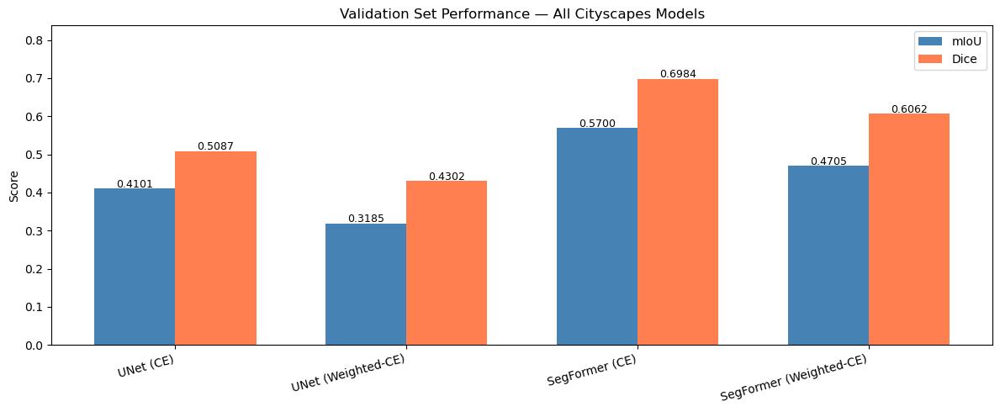

In [32]:
# --- Validation Set: mIoU & Dice bar chart for all models ---
test_results = {}
ce_crit = nn.CrossEntropyLoss(ignore_index=IGNORE_INDEX)

for model_name, model_instance in models.items():
    model_instance.to(device).eval()
    t_iou = IoUMetric(num_classes=NUM_CLASSES, ignore_index=255)
    t_dice = DiceScoreMetric(num_classes=NUM_CLASSES, ignore_index=255)
    _, t_metrics = validate_epoch(
        model_instance, val_loader, ce_crit, device, metrics=[t_iou, t_dice]
    )
    test_results[model_name] = t_metrics

names = list(test_results.keys())
miou_vals = [test_results[n]['IoUMetric'] for n in names]
dice_vals = [test_results[n]['DiceScoreMetric'] for n in names]

x = np.arange(len(names))
width = 0.35
fig, ax = plt.subplots(figsize=(12, 5))
b1 = ax.bar(x - width/2, miou_vals, width, label='mIoU', color='steelblue')
b2 = ax.bar(x + width/2, dice_vals, width, label='Dice', color='coral')
ax.set_ylabel('Score')
ax.set_title('Validation Set Performance — All Cityscapes Models')
ax.set_xticks(x)
ax.set_xticklabels(names, rotation=15, ha='right')
ax.legend()
ax.set_ylim(0, max(max(miou_vals, default=0.01), max(dice_vals, default=0.01)) * 1.2)
for bar in b1:
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.003,
            f'{bar.get_height():.4f}', ha='center', fontsize=9)
for bar in b2:
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.003,
            f'{bar.get_height():.4f}', ha='center', fontsize=9)
plt.tight_layout()
plt.savefig(str(EXPERIMENTS_DIR / 'cityscapes_test_metrics.png'), dpi=150, bbox_inches='tight')
plt.show()


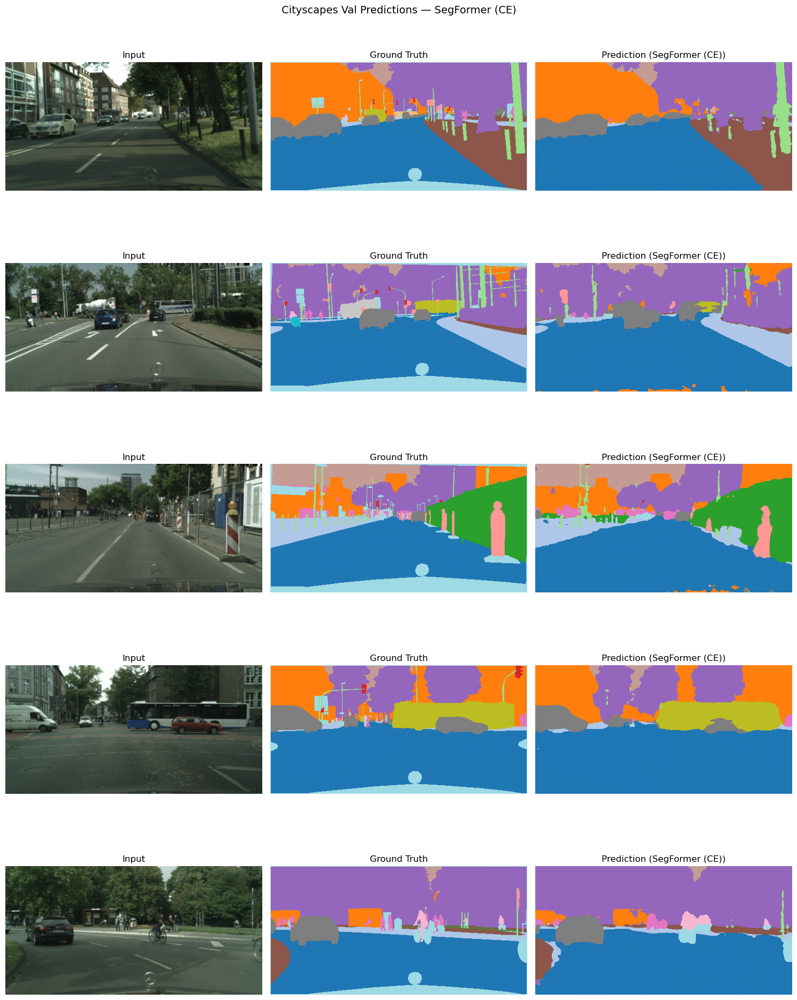

In [33]:
# --- Qualitative: Test predictions from best model vs worst ---
import random

# Pick the best model by mIoU
best_name = max(test_results, key=lambda k: test_results[k]['IoUMetric'])
best_m = models[best_name].to(device).eval()

mean = np.array([0.485, 0.456, 0.406])
std  = np.array([0.229, 0.224, 0.225])

sample_idx = random.sample(range(len(val_dataset)), min(5, len(val_dataset)))
fig, axes = plt.subplots(len(sample_idx), 3, figsize=(15, 4 * len(sample_idx)))
if len(sample_idx) == 1:
    axes = axes[None, :]

for row, idx in enumerate(sample_idx):
    img_t, mask_t = val_dataset[idx]
    with torch.no_grad():
        pred = best_m(img_t.unsqueeze(0).to(device)).argmax(dim=1).squeeze().cpu().numpy()

    img_np = img_t.permute(1, 2, 0).cpu().numpy() * std + mean
    img_np = np.clip(img_np, 0, 1)

    axes[row, 0].imshow(img_np)
    axes[row, 0].set_title('Input')
    axes[row, 0].axis('off')

    axes[row, 1].imshow(mask_t.cpu().numpy(), cmap='tab20', vmin=0, vmax=NUM_CLASSES-1)
    axes[row, 1].set_title('Ground Truth')
    axes[row, 1].axis('off')

    axes[row, 2].imshow(pred, cmap='tab20', vmin=0, vmax=NUM_CLASSES-1)
    axes[row, 2].set_title(f'Prediction ({best_name})')
    axes[row, 2].axis('off')

plt.suptitle(f'Cityscapes Val Predictions — {best_name}', fontsize=14)
plt.tight_layout()
plt.savefig(str(EXPERIMENTS_DIR / 'cityscapes_test_qualitative.png'), dpi=150, bbox_inches='tight')
plt.show()


UNet (CE): mIoU = 0.4101


UNet (Weighted-CE): mIoU = 0.3185


SegFormer (CE): mIoU = 0.5700


SegFormer (Weighted-CE): mIoU = 0.4705


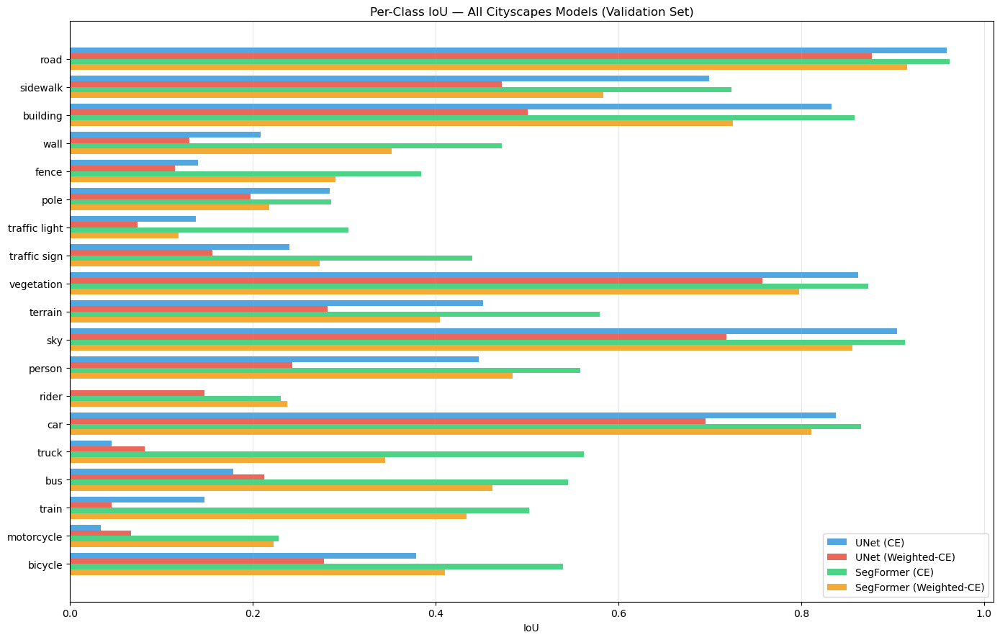


Class                          UNet (CE)  UNet (Weighted-CE)      SegFormer (CE)SegFormer (Weighted-CE)
----------------------------------------------------------------------------------------------------
road                              0.9592              0.8770              0.9620              0.9154
sidewalk                          0.6995              0.4728              0.7237              0.5833
building                          0.8332              0.5004              0.8586              0.7250
wall                              0.2087              0.1307              0.4724              0.3518
fence                             0.1404              0.1146              0.3839              0.2905
pole                              0.2839              0.1979              0.2855              0.2179
traffic light                     0.1378              0.0739              0.3048              0.1189
traffic sign                      0.2402              0.1558              0.4404       

In [34]:
# --- Per-Class IoU for ALL Cityscapes models on the validation set ---
import matplotlib.pyplot as plt
import numpy as np

class_names_cs = [
    'road', 'sidewalk', 'building', 'wall', 'fence',
    'pole', 'traffic light', 'traffic sign', 'vegetation', 'terrain',
    'sky', 'person', 'rider', 'car', 'truck',
    'bus', 'train', 'motorcycle', 'bicycle'
]

ce_crit_pc = nn.CrossEntropyLoss(ignore_index=IGNORE_INDEX)
all_perclass = {}  # model_name -> array of per-class IoU

for model_name, model_instance in models.items():
    model_instance.to(device).eval()
    iou_m = IoUMetric(num_classes=NUM_CLASSES, ignore_index=255)
    _ = validate_epoch(model_instance, val_loader, ce_crit_pc, device, metrics=[iou_m])

    hist_m = iou_m.hist
    tp = torch.diag(hist_m)
    fp = hist_m.sum(dim=0) - tp
    fn = hist_m.sum(dim=1) - tp
    per_iou = (tp / (tp + fp + fn + 1e-6)).cpu().numpy()
    all_perclass[model_name] = per_iou
    print(f'{model_name}: mIoU = {per_iou.mean():.4f}')

# --- Grouped horizontal bar chart ---
n_classes = len(class_names_cs)
n_models = len(all_perclass)
bar_height = 0.8 / n_models

fig, ax = plt.subplots(figsize=(14, 9))
colors = ['#3498db', '#e74c3c', '#2ecc71', '#f39c12', '#9b59b6'][:n_models]

for j, (mname, iou_arr) in enumerate(all_perclass.items()):
    y_pos = np.arange(n_classes) + j * bar_height
    ax.barh(y_pos, iou_arr, height=bar_height, label=mname, color=colors[j], alpha=0.85)

ax.set_yticks(np.arange(n_classes) + bar_height * (n_models - 1) / 2)
ax.set_yticklabels(class_names_cs)
ax.set_xlabel('IoU')
ax.set_title('Per-Class IoU — All Cityscapes Models (Validation Set)')
ax.legend(loc='lower right')
ax.invert_yaxis()
ax.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.savefig(str(EXPERIMENTS_DIR / 'cityscapes_perclass_iou.png'), dpi=150, bbox_inches='tight')
plt.show()

# --- Print table ---
print(f'\n{"Class":<20}', end='')
for mname in all_perclass:
    print(f'{mname:>20}', end='')
print()
print('-' * (20 + 20 * n_models))
for i, cname in enumerate(class_names_cs):
    print(f'{cname:<20}', end='')
    for mname in all_perclass:
        print(f'{all_perclass[mname][i]:>20.4f}', end='')
    print()
print('-' * (20 + 20 * n_models))
print(f'{"mIoU":<20}', end='')
for mname in all_perclass:
    print(f'{all_perclass[mname].mean():>20.4f}', end='')
print()


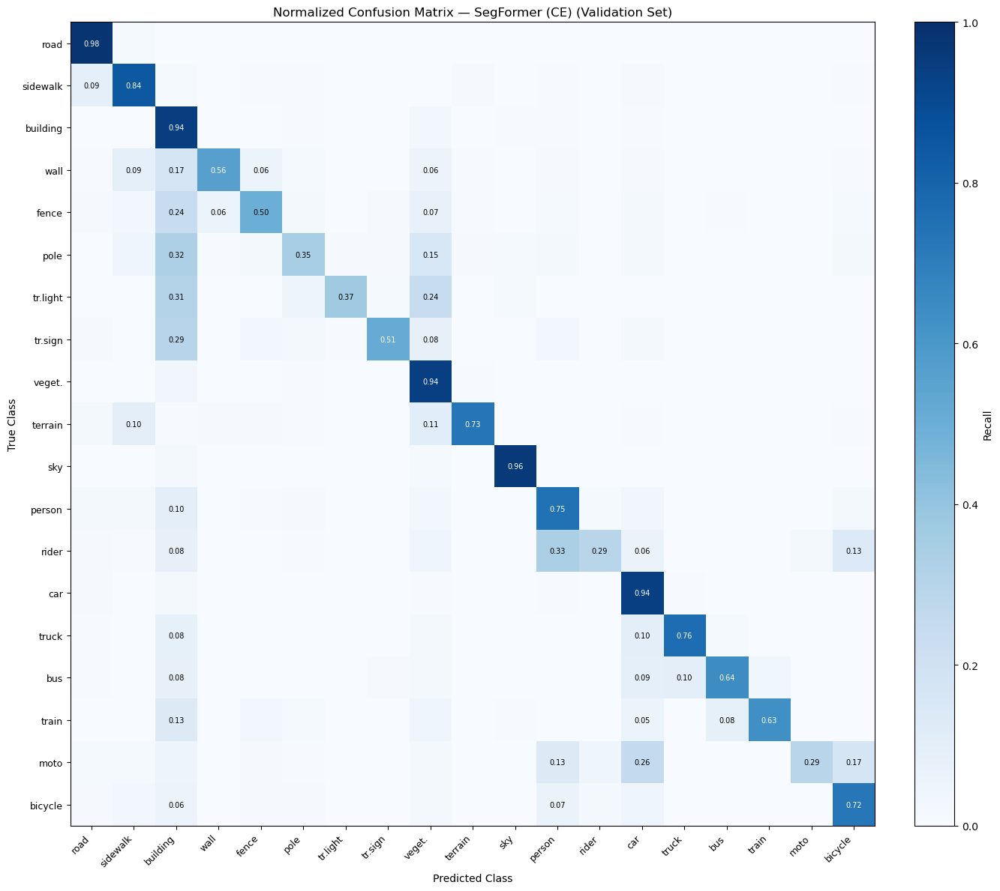

In [35]:
# --- Confusion Matrix Heatmap (best Cityscapes model) ---
import matplotlib.pyplot as plt
import numpy as np

class_names_cm = [
    'road', 'sidewalk', 'building', 'wall', 'fence',
    'pole', 'tr.light', 'tr.sign', 'veget.', 'terrain',
    'sky', 'person', 'rider', 'car', 'truck',
    'bus', 'train', 'moto', 'bicycle'
]

# Pick the best model
best_name_cm = max(test_results, key=lambda k: test_results[k]['IoUMetric'])
best_m_cm = models[best_name_cm].to(device).eval()

# Build confusion matrix via IoUMetric (it stores the histogram)
cm_iou = IoUMetric(num_classes=NUM_CLASSES, ignore_index=255)
_ = validate_epoch(best_m_cm, val_loader, nn.CrossEntropyLoss(ignore_index=IGNORE_INDEX), device, metrics=[cm_iou])

cm = cm_iou.hist.cpu().numpy().astype(float)

# Normalize each row (true class) to get recall per class
row_sums = cm.sum(axis=1, keepdims=True)
row_sums[row_sums == 0] = 1  # avoid division by zero
cm_norm = cm / row_sums

fig, ax = plt.subplots(figsize=(14, 12))
im = ax.imshow(cm_norm, cmap='Blues', vmin=0, vmax=1)

ax.set_xticks(range(NUM_CLASSES))
ax.set_yticks(range(NUM_CLASSES))
ax.set_xticklabels(class_names_cm, rotation=45, ha='right', fontsize=9)
ax.set_yticklabels(class_names_cm, fontsize=9)
ax.set_xlabel('Predicted Class')
ax.set_ylabel('True Class')
ax.set_title(f'Normalized Confusion Matrix — {best_name_cm} (Validation Set)')

# Annotate cells with values > 0.05
for r in range(NUM_CLASSES):
    for c in range(NUM_CLASSES):
        val = cm_norm[r, c]
        if val > 0.05:
            color = 'white' if val > 0.5 else 'black'
            ax.text(c, r, f'{val:.2f}', ha='center', va='center', fontsize=7, color=color)

fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label='Recall')
plt.tight_layout()
plt.savefig(str(EXPERIMENTS_DIR / 'cityscapes_confusion_matrix.png'), dpi=150, bbox_inches='tight')
plt.show()


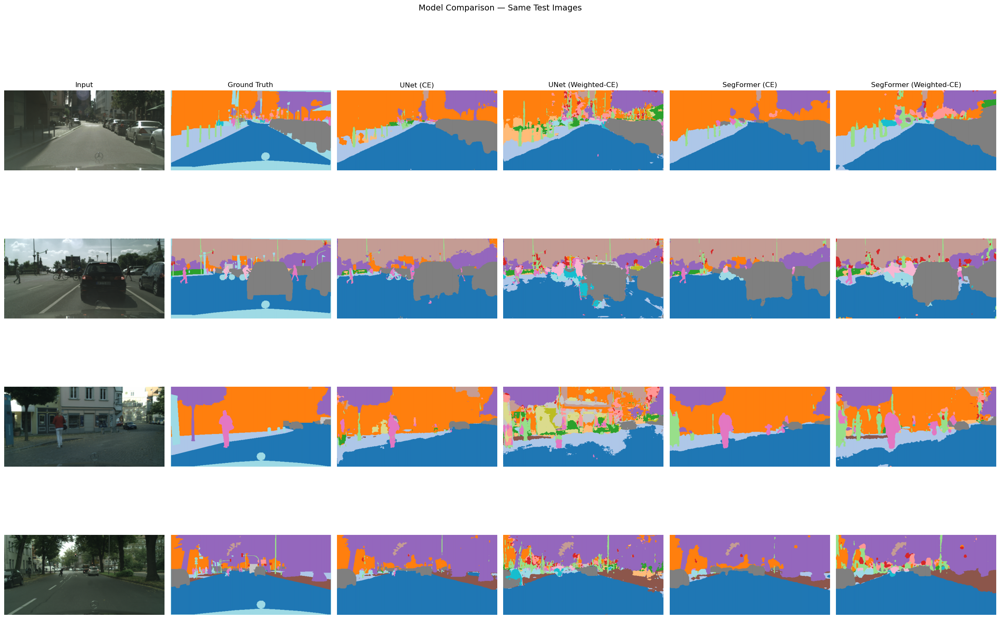

In [36]:
# --- Side-by-Side Predictions: All models on same test images ---
import random

n_samples = 4
model_names_list = list(models.keys())
n_models = len(model_names_list)
n_cols = n_models + 2  # input + GT + each model

sample_idx_comp = random.sample(range(len(val_dataset)), min(n_samples, len(val_dataset)))

mean = np.array([0.485, 0.456, 0.406])
std  = np.array([0.229, 0.224, 0.225])

fig, axes = plt.subplots(n_samples, n_cols, figsize=(4 * n_cols, 4 * n_samples))
if n_samples == 1:
    axes = axes[None, :]

for row, idx in enumerate(sample_idx_comp):
    img_t, mask_t = val_dataset[idx]

    # Input image
    img_np = img_t.cpu().permute(1, 2, 0).cpu().numpy() * std + mean
    img_np = np.clip(img_np, 0, 1)
    axes[row, 0].imshow(img_np)
    axes[row, 0].set_title('Input' if row == 0 else '')
    axes[row, 0].axis('off')

    # Ground truth
    axes[row, 1].imshow(mask_t.cpu().numpy(), cmap='tab20', vmin=0, vmax=NUM_CLASSES-1)
    axes[row, 1].set_title('Ground Truth' if row == 0 else '')
    axes[row, 1].axis('off')

    # Each model's prediction
    for col, mname in enumerate(model_names_list):
        m = models[mname].to(device).eval()
        with torch.no_grad():
            pred = m(img_t.unsqueeze(0).to(device)).argmax(dim=1).squeeze().cpu().numpy()
        axes[row, col + 2].imshow(pred, cmap='tab20', vmin=0, vmax=NUM_CLASSES-1)
        axes[row, col + 2].set_title(mname if row == 0 else '')
        axes[row, col + 2].axis('off')

plt.suptitle('Model Comparison — Same Test Images', fontsize=14, y=1.01)
plt.tight_layout()
plt.savefig(str(EXPERIMENTS_DIR / 'cityscapes_model_comparison.png'), dpi=150, bbox_inches='tight')
plt.show()


In [37]:
# !pip install monai

In [38]:
# from monai.metrics import HausdorffDistanceMetric

In [39]:
# warnings.filterwarnings("ignore", module="monai.metrics")

# hausdorffDistanceMetric = HausdorffDistanceMetric(include_background=False, percentile=95)

# scores=[]

# for model_name, model in models.items():
#     model.eval()

#     with torch.no_grad():
#         for images, labels in val_loader:
#             images = images.to(device)
#             labels = labels.to(device)

#             # Get the propabilities for each class
#             probabilities = model(images)

#             # Get the predicted class
#             predicted_class = torch.argmax(probabilities, dim=1)

#             # Convert predictions to one-hot encoding (move to CPU to avoid OOM)
#             onehot_classes = F.one_hot(predicted_class.cpu(), num_classes=NUM_CLASSES).permute(0, 3, 1, 2)

#             # Convert labels to one-hot encoding
#             labels_cpu = labels.cpu().clone()
#             labels_cpu[labels_cpu == 255] = 0 # fix 'cudaErrorAssert'
#             onehot_labels = F.one_hot(labels_cpu, num_classes=NUM_CLASSES).permute(0, 3, 1, 2)

#             hausdorffDistanceMetric(y_pred=onehot_classes, y=onehot_labels)

#         score = hausdorffDistanceMetric.aggregate().item()
#         print(f"Hausdorff Distance for model {model_name}: {score}")

#         scores.append(score)
#         hausdorffDistanceMetric.reset()

In [40]:
# # --- Hausdorff Distance 95th percentile bar chart ---
# model_names_h = list(models.keys())

# fig, ax = plt.subplots(figsize=(10, 5))
# colors_h = ['#3498db', '#e74c3c', '#2ecc71', '#f39c12'][:len(model_names_h)]
# bars = ax.bar(model_names_h, scores, color=colors_h)
# ax.set_ylabel('Hausdorff Distance (95th percentile)')
# ax.set_title('Hausdorff Distance Comparison — Cityscapes Validation Set')
# for bar, val in zip(bars, scores):
#     ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
#             f'{val:.2f}', ha='center', va='bottom', fontsize=10)
# plt.xticks(rotation=15, ha='right')
# plt.tight_layout()
# plt.savefig(str(EXPERIMENTS_DIR / 'cityscapes_hausdorff.png'), dpi=150, bbox_inches='tight')
# plt.show()


# [COMMENTED OUT] This section is disabled — no pre-generated augmented dataset on disk.
# **TRAIN MODELS IN AUGMENTENT DATASET**

In [41]:
# # Augmented dataset paths
# IMAGES_AUG_DIR = DATA_PATH / "Datasets" / "CityScapes5000_augmented" / "images"
# MASKS_AUG_DIR = DATA_PATH / "Datasets" / "CityScapes5000_augmented" / "masks"
# MASKS_DIR = LABELS_DIR  # original Cityscapes gtFine labels
# COLORED_AUG_MASKS_DIR = DATA_PATH / "Datasets" / "CityScapes5000_augmented" / "colored_masks"

# print(f"Augmented images dir: {IMAGES_AUG_DIR}")
# print(f"  Exists: {IMAGES_AUG_DIR.exists()}")
# print(f"Augmented masks dir: {MASKS_AUG_DIR}")
# print(f"  Exists: {MASKS_AUG_DIR.exists()}")


In [42]:
# class CityscapesAugmentedDataset(Dataset):
#     """
#     Dataset for Cityscapes augmentned dataset.
#     """

#     def __init__(self, img_dirs, mask_dirs, split='train', img_size=(512, 256),
#                  use_train_ids=True, transform=None):
#         """
#         Args:
#             img_dirs: List of paths to image directories
#             mask_dirs: List of paths to mask directories
#             split: 'train', 'val', or 'test'
#             img_size: Tuple (width, height) for resizing
#             use_train_ids: If True, map 34 classes to 19 training classes
#             transform: Optional transforms for augmentation
#         """
#         self.split = split
#         self.img_width, self.img_height = img_size
#         self.use_train_ids = use_train_ids
#         self.transform = transform

#         # Collect all image paths
#         self.images = []
#         self.masks = []

#         for img_dir in img_dirs:
#             path = Path(img_dir)
#             for img_path in sorted(path.glob("*.png")):
#                 self.images.append(img_path)

#         for mask_dir in mask_dirs:
#             path = Path(mask_dir)
#             for mask_path in sorted(path.glob("*.png")):
#                 self.masks.append(mask_path)

#         print(f"  Found {len(self.images)} image-label pairs in {split}")

#     def __len__(self):
#         return len(self.images)

#     def _map_to_train_ids(self, mask):
#         """Map original label IDs (0-33) to training IDs (0-18, 255=ignore)"""
#         mask_copy = mask.copy()
#         for orig_id, train_id in TRAIN_ID_MAP.items():
#             mask_copy[mask == orig_id] = train_id
#         return mask_copy

#     def __getitem__(self, idx):
#         # Load image
#         img = Image.open(self.images[idx]).convert('RGB')

#         # Load label (as single channel)
#         mask = Image.open(self.masks[idx])

#         # Convert to numpy
#         img_array = np.array(img)
#         mask_array = np.array(mask, dtype=np.int64)

#         # Map to training IDs if requested
#         if self.use_train_ids:
#             mask_array = self._map_to_train_ids(mask_array)

#         # Apply transforms (if any)
#         if self.transform:
#             augmented = self.transform(image=img_array, mask=mask_array)
#             img_array = augmented["image"]
#             mask_array = augmented["mask"]

#         # Convert to tensor
#         if isinstance(img_array, np.ndarray):
#             img_tensor = torch.from_numpy(img_array).permute(2,0,1).float() / 255.0
#         else:
#             img_tensor = img_array.float()

#         if isinstance(mask_array, np.ndarray):
#             mask_tensor = torch.from_numpy(mask_array).long()
#         else:
#             mask_tensor = mask_array.long()

#         return img_tensor, mask_tensor

In [43]:
# first_aug_img_path = IMAGES_AUG_DIR / "aachen_000090_000019_aug.png"
# first_aug_img_path_mask = MASKS_AUG_DIR / "aachen_000090_000019_aug.png"
# first_aug_img_path_colored_mask = COLORED_AUG_MASKS_DIR / "aachen_000090_000019_aug.png"

# first_aug_img = Image.open(first_aug_img_path)
# first_aug_img_mask = Image.open(first_aug_img_path_mask)
# first_aug_img_colored_mask = Image.open(first_aug_img_path_colored_mask)

# fix, ax = plt.subplots(1, 3, figsize=(10, 5))
# ax[0].imshow(first_aug_img)
# ax[1].imshow(first_aug_img_mask, cmap='gray', vmin=0, vmax=19)
# ax[2].imshow(first_aug_img_colored_mask)
# ax[0].axis('off')
# ax[1].axis('off')
# ax[2].axis('off')
# plt.show()

In [44]:
# train_aug_dataset = CityscapesAugmentedDataset([IMAGES_DIR, IMAGES_AUG_DIR], [MASKS_DIR, MASKS_AUG_DIR], split='train', img_size=IMG_SIZE, transform=train_tf, use_train_ids=True)

# # Create dataloaders
# train_aug_loader = DataLoader(
#     train_aug_dataset,
#     batch_size=BATCH_SIZE,
#     shuffle=True,
#     num_workers=NUM_WORKERS,
#     pin_memory=True
# )

# print("DATASET SUMMARY")
# print("=" * 60)
# print(f"Image size: {IMG_SIZE[0]} x {IMG_SIZE[1]} (W x H)")
# print(f"Batch size: {BATCH_SIZE}")
# print(f"Number of classes: {NUM_CLASSES}")
# print(f"\nTrain: {len(train_aug_dataset)} images, {len(train_aug_loader)} batches")

In [ ]:
# images, labels = next(iter(train_aug_loader))
# images.shape, labels.shape

# unique_labels, counts = torch.unique(labels, return_counts=True)

# unique_labels_np = unique_labels.cpu().numpy()
# counts_np = counts.cpu().numpy()

# plot_labels = []
# for label in unique_labels_np:
#     if label == 255:
#         plot_labels.append('Unlabeled')
#     else:
#         plot_labels.append(TRAIN_CLASSES[label])

# plt.figure(figsize=(20, 6))
# plt.bar(plot_labels, counts_np)
# plt.xlabel('Class Index')
# plt.ylabel('Count')
# plt.title('Class Distribution in Training Data')
# plt.show()

NameError: name 'train_aug_loader' is not defined

In [ ]:
# Calculation takes much time. We calculate the weights once and then we assign them statically.
# Uncomment next line to calculate the weights

# aug_class_weights = calculate_classes_weights(train_aug_loader)

# aug_class_weights = torch.tensor([0.0189, 0.0884, 0.0233, 0.7392, 0.5502, 0.3616, 2.1350, 0.8559, 0.0310,
#         0.4382, 0.1427, 0.3447, 2.7739, 0.0678, 1.8411, 1.5020, 1.7467, 4.3500,
#         0.9895]).to(device)

In [ ]:
# model_aug_results = []
# histories_aug = {}
# models_aug = {}

# AUG_MODELS_TO_TEST = {
#     'UNet': UNET(in_channels=3, num_classes=NUM_CLASSES),
#     'SegFormer-FromScratch': SegFormer(num_classes=NUM_CLASSES, config=SegformerConfig(num_labels=NUM_CLASSES)),
#     'SegFormer': SegFormer(num_classes=NUM_CLASSES, config={}, pretrained_model_name="nvidia/mit-b0")
# }

# # Choose loss for augmented training (set to CE or Dice)
# AUG_LOSS = 'CE'  # options: 'CE', 'Weighted-CE', 'Dice'
# if AUG_LOSS == 'CE':
#     criterion = nn.CrossEntropyLoss(ignore_index=IGNORE_INDEX)
# elif AUG_LOSS == 'Weighted-CE':
#     criterion = nn.CrossEntropyLoss(weight=aug_class_weights, ignore_index=IGNORE_INDEX)
# elif AUG_LOSS == 'Dice':
#     criterion = DiceLoss(num_classes=NUM_CLASSES, ignore_index=IGNORE_INDEX)
# else:
#     raise ValueError(f'Unknown AUG_LOSS: {AUG_LOSS}')

# print(f"Comparing Models: {list(AUG_MODELS_TO_TEST.keys())}")

# for model_name, model_instance in AUG_MODELS_TO_TEST.items():
#     print(f"\n" + "="*40)
#     print(f"Training Model: {model_name}")
#     print("="*40)

#     LR = ARCH_TO_LR.get(model_name, 1e-4)

# #     Setup
#     model = model_instance.to(device)
#     optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4)
#     scheduler = optim.lr_scheduler.OneCycleLR(
#         optimizer, max_lr=LR, steps_per_epoch=len(train_aug_loader), epochs=NUM_EPOCHS
#     )

# #     Re-initialize metrics
#     train_iou = IoUMetric(num_classes=NUM_CLASSES, ignore_index=255)
#     train_dice = DiceScoreMetric(num_classes=NUM_CLASSES, ignore_index=255)
#     val_iou = IoUMetric(num_classes=NUM_CLASSES, ignore_index=255)
#     val_dice = DiceScoreMetric(num_classes=NUM_CLASSES, ignore_index=255)

#     history = {'train_loss': [], 'val_loss': [], 'val_miou': [], 'val_dice': []}
#     best_miou = 0.0

#     for epoch in range(NUM_EPOCHS):
#         # Train
#         train_loss, train_metrics = train_epoch(
#             model, train_aug_loader, optimizer, criterion, device,
#             scheduler=scheduler, metrics=[train_iou, train_dice]
#         )

#         # Validate
#         val_loss, val_metrics = validate_epoch(
#             model, val_loader, criterion, device, metrics=[val_iou, val_dice]
#         )

#         # Log
#         history['train_loss'].append(train_loss)
#         history['val_loss'].append(val_loss)
#         history['val_miou'].append(val_metrics['IoUMetric'])
#         history['val_dice'].append(val_metrics['DiceScoreMetric'])

#         print(f"Epoch {epoch+1}/{NUM_EPOCHS} | {model_name} | Val mIoU: {val_metrics['IoUMetric']:.4f} | Dice: {val_metrics['DiceScoreMetric']:.4f}")

#         if val_metrics['IoUMetric'] > best_miou:
#             best_miou = val_metrics['IoUMetric']

#     models_aug[model_name] = model

#     histories_aug[model_name] = history
#     model_aug_results.append({
#         'Model': model_name,
#         'Best mIoU': best_miou,
#         'Final Train Loss': history['train_loss'][-1],
#         'Final Val Loss': history['val_loss'][-1]
#     })

# print("\nComparison Complete!")

Loading weights:   0%|          | 0/192 [00:00<?, ?it/s]

SegformerForSemanticSegmentation LOAD REPORT from: nvidia/mit-b0
Key                                           | Status     | 
----------------------------------------------+------------+-
classifier.weight                             | UNEXPECTED | 
classifier.bias                               | UNEXPECTED | 
decode_head.linear_c.{0, 1, 2, 3}.proj.bias   | MISSING    | 
decode_head.batch_norm.running_mean           | MISSING    | 
decode_head.batch_norm.num_batches_tracked    | MISSING    | 
decode_head.classifier.weight                 | MISSING    | 
decode_head.linear_fuse.weight                | MISSING    | 
decode_head.linear_c.{0, 1, 2, 3}.proj.weight | MISSING    | 
decode_head.batch_norm.weight                 | MISSING    | 
decode_head.classifier.bias                   | MISSING    | 
decode_head.batch_norm.running_var            | MISSING    | 
decode_head.batch_norm.bias                   | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different ta

Comparing Models: ['UNet', 'SegFormer-FromScratch', 'SegFormer']

Training Model: UNet


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/10 | UNet | Val mIoU: 0.1655


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 2/10 | UNet | Val mIoU: 0.1891


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ed4f89e4180>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ed4f89e4180>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 3/10 | UNet | Val mIoU: 0.2051


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 4/10 | UNet | Val mIoU: 0.2680


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 5/10 | UNet | Val mIoU: 0.2903


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 6/10 | UNet | Val mIoU: 0.2596


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 7/10 | UNet | Val mIoU: 0.3167


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ed4f89e4180>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
    Exception ignored in:   <function _MultiProcessingDataLoaderIter.__del__ at 0x7ed4f89e4180> 
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
^^    ^^^self._shutdown_workers()
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^^    ^if w.is_alive():^

   File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
     assert self._parent_pid == os.getpid(), 'can only test a child process'
     Exception ignored in:   <function _M

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 8/10 | UNet | Val mIoU: 0.3211


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 9/10 | UNet | Val mIoU: 0.3356


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 10/10 | UNet | Val mIoU: 0.3403

Training Model: SegFormer-FromScratch


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/10 | SegFormer-FromScratch | Val mIoU: 0.0950


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 2/10 | SegFormer-FromScratch | Val mIoU: 0.1375


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 3/10 | SegFormer-FromScratch | Val mIoU: 0.1673


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 4/10 | SegFormer-FromScratch | Val mIoU: 0.1718


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ed4f89e4180>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ed4f89e4180>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 5/10 | SegFormer-FromScratch | Val mIoU: 0.1885


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 6/10 | SegFormer-FromScratch | Val mIoU: 0.1952


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 7/10 | SegFormer-FromScratch | Val mIoU: 0.2028


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 8/10 | SegFormer-FromScratch | Val mIoU: 0.2086


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 9/10 | SegFormer-FromScratch | Val mIoU: 0.2173


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ed4f89e4180>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ed4f89e4180>^

Traceback (most recent call last):
AssertionError:   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
can only test a child process    
self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 10/10 | SegFormer-FromScratch | Val mIoU: 0.2163

Training Model: SegFormer


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/10 | SegFormer | Val mIoU: 0.0953


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 2/10 | SegFormer | Val mIoU: 0.2076


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 3/10 | SegFormer | Val mIoU: 0.2563


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 4/10 | SegFormer | Val mIoU: 0.2750


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 5/10 | SegFormer | Val mIoU: 0.2937


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 6/10 | SegFormer | Val mIoU: 0.3018


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 7/10 | SegFormer | Val mIoU: 0.3148


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 8/10 | SegFormer | Val mIoU: 0.3153


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 9/10 | SegFormer | Val mIoU: 0.3195


Training:   0%|          | 0/1488 [00:00<?, ?it/s]

Validation:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 10/10 | SegFormer | Val mIoU: 0.3140

Comparison Complete!


In [ ]:
# for model_name, model in models_aug.items():
#     weights_dir = get_weights_dir(f"{model_name}_aug")
#     torch.save(model.state_dict(), str(weights_dir / 'final_model.pt'))


--- Summary Table ---
                   Model  Best mIoU  Final Train Loss  Final Val Loss
0                   UNet   0.340318          1.023988        1.105452
1  SegFormer-FromScratch   0.217307          1.614007        1.763586
2              SegFormer   0.319487          1.063282        1.284236


/tmp/ipython-input-3605067310.py:30: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


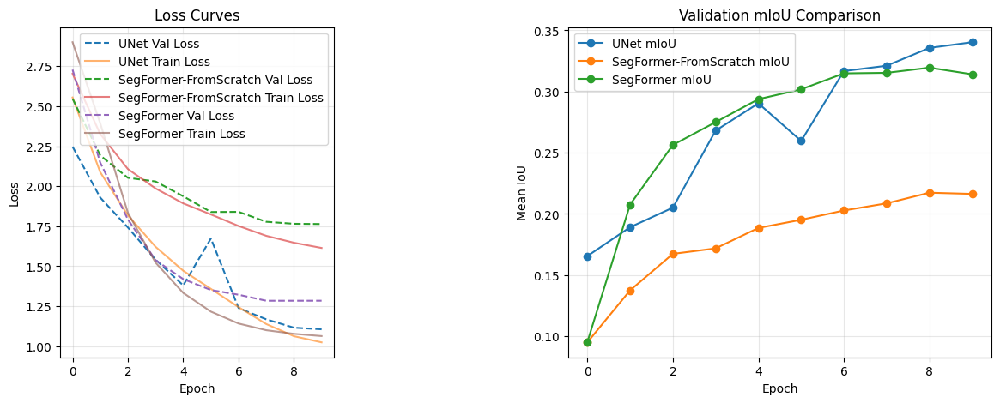

In [ ]:
# # Summary Dictionary to DataFrame
# df_res = pd.DataFrame(model_aug_results)
# print("\n--- Summary Table ---")
# print(df_res)

# # Plotting
# plt.figure(figsize=(14, 5))

# # Loss
# plt.subplot(1, 2, 1)
# for name, hist in histories_aug.items():
#     plt.plot(hist['val_loss'], label=f"{name} Val Loss", linestyle='--')
#     plt.plot(hist['train_loss'], label=f"{name} Train Loss", alpha=0.6)
# plt.title("Loss Curves")
# plt.xlabel("Epoch")
# plt.ylabel("Loss")
# plt.legend()
# plt.grid(True, alpha=0.3)

# # mIoU
# plt.subplot(1, 2, 2)
# for name, hist in histories_aug.items():
#     plt.plot(hist['val_miou'], label=f"{name} mIoU", marker='o')
# plt.title("Validation mIoU Comparison")
# plt.xlabel("Epoch")
# plt.ylabel("Mean IoU")
# plt.legend()
# plt.grid(True, alpha=0.3)

# plt.tight_layout()
# plt.show()

In [ ]:
# warnings.filterwarnings("ignore", module="monai.metrics")

# hausdorffDistanceMetric = HausdorffDistanceMetric(include_background=False, percentile=95)

# scores=[]

# for model_name, model in models_aug.items():
#     model.eval()

#     with torch.no_grad():
#         for images, labels in test_loader:
#             images = images.to(device)
#             labels = labels.to(device)

#             # Get the propabilities for each class
#             probabilities = model(images)

#             # Get the predicted class
#             predicted_class = torch.argmax(probabilities, dim=1)

#             # Convert predictions to one-hot encoding (move to CPU to avoid OOM)
#             onehot_classes = F.one_hot(predicted_class.cpu(), num_classes=NUM_CLASSES).permute(0, 3, 1, 2)

#             # Convert labels to one-hot encoding
#             labels_cpu = labels.cpu().clone()
#             labels_cpu[labels_cpu == 255] = 0 # fix 'cudaErrorAssert'
#             onehot_labels = F.one_hot(labels_cpu, num_classes=NUM_CLASSES).permute(0, 3, 1, 2)

#             hausdorffDistanceMetric(y_pred=onehot_classes, y=onehot_labels)

#         score = hausdorffDistanceMetric.aggregate().item()
#         print(f"Hausdorff Distance for model {model_name}: {score}")

#         scores.append(score)
#         hausdorffDistanceMetric.reset()


# 6. SegFormer From Scratch (Single Experiment)

Train a SegFormer **from scratch** (no pretrained encoder) using CE loss only,
to compare against the pretrained version above.


In [46]:
# --- Free GPU memory from previous models ---
for m in models.values():
    m.cpu()
torch.cuda.empty_cache()

# --- SegFormer From Scratch: single experiment with CE loss ---
SCRATCH_LR = 1e-4
SCRATCH_EPOCHS = NUM_EPOCHS  # same as main experiments

scratch_model = SegFormer(
    num_classes=NUM_CLASSES,
    config=SegformerConfig(num_labels=NUM_CLASSES),  # from scratch
).to(device)

scratch_criterion = nn.CrossEntropyLoss(ignore_index=IGNORE_INDEX)
scratch_optimizer = optim.AdamW(scratch_model.parameters(), lr=SCRATCH_LR, weight_decay=1e-4)
scratch_scheduler = optim.lr_scheduler.OneCycleLR(
    scratch_optimizer, max_lr=max(SCRATCH_LR, 8e-3),
    steps_per_epoch=len(train_loader), epochs=SCRATCH_EPOCHS
)

scratch_history = {'train_loss': [], 'val_loss': [], 'val_miou': [], 'val_dice': []}
scratch_best_miou = 0.0

print('=' * 50)
print('Training: SegFormer From Scratch (CE)')
print('=' * 50)

for epoch in range(SCRATCH_EPOCHS):
    metrics_train = [
        IoUMetric(NUM_CLASSES, ignore_index=255),
        DiceScoreMetric(NUM_CLASSES, ignore_index=255)
    ]
    metrics_val = [
        IoUMetric(NUM_CLASSES, ignore_index=255),
        DiceScoreMetric(NUM_CLASSES, ignore_index=255)
    ]

    train_loss, train_m = train_epoch(
        scratch_model, train_loader, scratch_optimizer, scratch_criterion,
        device, scheduler=scratch_scheduler, metrics=metrics_train
    )
    val_loss, val_m = validate_epoch(
        scratch_model, val_loader, scratch_criterion, device, metrics=metrics_val
    )

    scratch_history['train_loss'].append(train_loss)
    scratch_history['val_loss'].append(val_loss)
    scratch_history['val_miou'].append(val_m['IoUMetric'])
    scratch_history['val_dice'].append(val_m['DiceScoreMetric'])

    if val_m['IoUMetric'] > scratch_best_miou:
        scratch_best_miou = val_m['IoUMetric']
        weights_dir = get_weights_dir('SegFormer-FromScratch')
        torch.save(scratch_model.state_dict(), str(weights_dir / 'best_model.pt'))

    print(f"Epoch {epoch+1}/{SCRATCH_EPOCHS} | "
          f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | "
          f"Val mIoU: {val_m['IoUMetric']:.4f} | Val Dice: {val_m['DiceScoreMetric']:.4f}")


Training: SegFormer From Scratch (CE)


Epoch 1/15 | Train Loss: 1.0004 | Val Loss: 0.8871 | Val mIoU: 0.1681 | Val Dice: 0.2172


Epoch 2/15 | Train Loss: 0.7566 | Val Loss: 1.0799 | Val mIoU: 0.1646 | Val Dice: 0.2159


Epoch 3/15 | Train Loss: 0.6827 | Val Loss: 0.9159 | Val mIoU: 0.1794 | Val Dice: 0.2335


Epoch 4/15 | Train Loss: 0.6899 | Val Loss: 0.6748 | Val mIoU: 0.2157 | Val Dice: 0.2633


Epoch 5/15 | Train Loss: 0.6179 | Val Loss: 0.6732 | Val mIoU: 0.2249 | Val Dice: 0.2782


Epoch 6/15 | Train Loss: 0.5599 | Val Loss: 0.5645 | Val mIoU: 0.2521 | Val Dice: 0.3137


Epoch 7/15 | Train Loss: 0.4993 | Val Loss: 0.5080 | Val mIoU: 0.2812 | Val Dice: 0.3496


Epoch 8/15 | Train Loss: 0.4769 | Val Loss: 0.4692 | Val mIoU: 0.2889 | Val Dice: 0.3540


Epoch 9/15 | Train Loss: 0.4339 | Val Loss: 0.4538 | Val mIoU: 0.3118 | Val Dice: 0.3869


Epoch 10/15 | Train Loss: 0.4211 | Val Loss: 0.4433 | Val mIoU: 0.3104 | Val Dice: 0.3876


Epoch 11/15 | Train Loss: 0.3890 | Val Loss: 0.4008 | Val mIoU: 0.3434 | Val Dice: 0.4303


Epoch 12/15 | Train Loss: 0.3718 | Val Loss: 0.3886 | Val mIoU: 0.3442 | Val Dice: 0.4307


Epoch 13/15 | Train Loss: 0.3501 | Val Loss: 0.3754 | Val mIoU: 0.3623 | Val Dice: 0.4557


Epoch 14/15 | Train Loss: 0.3351 | Val Loss: 0.3668 | Val mIoU: 0.3687 | Val Dice: 0.4629


Epoch 15/15 | Train Loss: 0.3288 | Val Loss: 0.3652 | Val mIoU: 0.3700 | Val Dice: 0.4646


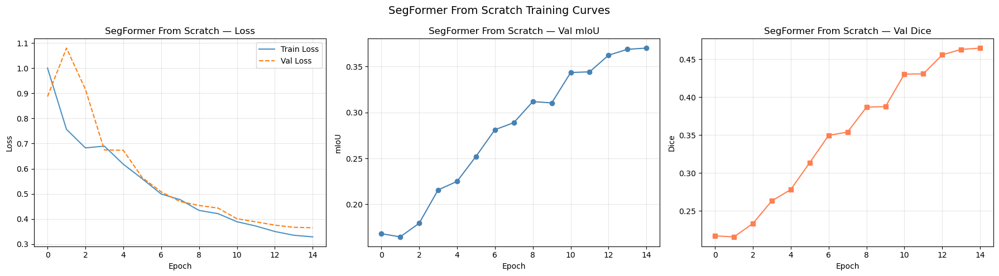

In [47]:
# --- SegFormer From Scratch: Training Curves ---
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].plot(scratch_history['train_loss'], label='Train Loss', alpha=0.8)
axes[0].plot(scratch_history['val_loss'], label='Val Loss', linestyle='--')
axes[0].set_title('SegFormer From Scratch — Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].plot(scratch_history['val_miou'], marker='o', color='steelblue')
axes[1].set_title('SegFormer From Scratch — Val mIoU')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('mIoU')
axes[1].grid(True, alpha=0.3)

axes[2].plot(scratch_history['val_dice'], marker='s', color='coral')
axes[2].set_title('SegFormer From Scratch — Val Dice')
axes[2].set_xlabel('Epoch')
axes[2].set_ylabel('Dice')
axes[2].grid(True, alpha=0.3)

plt.suptitle('SegFormer From Scratch Training Curves', fontsize=14)
plt.tight_layout()
plt.savefig(str(EXPERIMENTS_DIR / 'scratch_training_curves.png'), dpi=150, bbox_inches='tight')
plt.show()


In [48]:
# load segformer from scratch

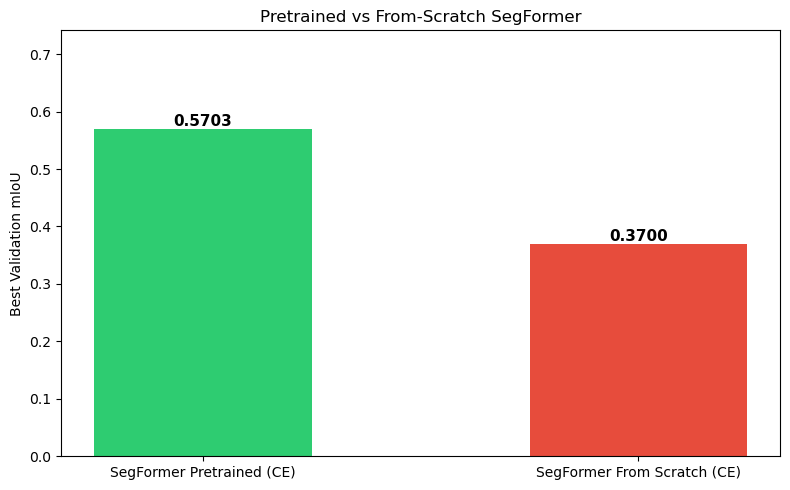

Pretrained advantage: +0.2003 mIoU (54.1% relative improvement)


In [49]:
# --- Compare Pretrained vs From-Scratch SegFormer ---
# Get the pretrained SegFormer's best mIoU from histories
pretrained_best = 0.0
for name, hist in histories.items():
    if 'SegFormer' in name and 'CE' in name and 'Weighted' not in name:
        pretrained_best = max(hist['val_miou'])
        break

comparison = {
    'SegFormer Pretrained (CE)': pretrained_best,
    'SegFormer From Scratch (CE)': scratch_best_miou,
}

fig, ax = plt.subplots(figsize=(8, 5))
names_c = list(comparison.keys())
vals_c = list(comparison.values())
bars = ax.bar(names_c, vals_c, color=['#2ecc71', '#e74c3c'], width=0.5)
ax.set_ylabel('Best Validation mIoU')
ax.set_title('Pretrained vs From-Scratch SegFormer')
ax.set_ylim(0, max(vals_c) * 1.3)
for bar, val in zip(bars, vals_c):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
            f'{val:.4f}', ha='center', fontsize=11, fontweight='bold')
plt.tight_layout()
plt.savefig(str(EXPERIMENTS_DIR / 'pretrained_vs_scratch.png'), dpi=150, bbox_inches='tight')
plt.show()

improvement = pretrained_best - scratch_best_miou
print(f'Pretrained advantage: +{improvement:.4f} mIoU ({improvement/scratch_best_miou*100:.1f}% relative improvement)' if scratch_best_miou > 0 else 'Scratch mIoU is 0')


# 7. Zero-Shot Cross-Dataset Evaluation on BDD100K

Testing domain generalization: evaluate the Cityscapes-trained SegFormer on BDD100K (different camera, locations, conditions).

BDD100K and Cityscapes share 19 common semantic classes. We'll:
1. Load BDD100K validation set
2. Run inference with the best SegFormer model (no fine-tuning)
3. Compute mIoU on the 19 overlapping classes

In [50]:
# BDD100K paths
BDD_ROOT = Path('../Datasets/BDD100')
BDD_IMAGES_DIR = BDD_ROOT / '10k'
BDD_LABELS_DIR = BDD_ROOT / 'labels'

print(f"BDD100K root: {BDD_ROOT}")
print(f"Images dir: {BDD_IMAGES_DIR}")
print(f"Labels dir: {BDD_LABELS_DIR}")
print(f"\nDataset exists: {BDD_ROOT.exists()}")

BDD100K root: ../Datasets/BDD100
Images dir: ../Datasets/BDD100/10k
Labels dir: ../Datasets/BDD100/labels

Dataset exists: True


In [51]:
class BDD100KDataset(Dataset):
    """BDD100K segmentation dataset.
    
    Images: 1280x720 RGB
    Labels: 1280x720 grayscale PNG with train IDs (0-18 for common classes, 255 for ignore)
    
    Label format: *_train_id.png files contain train IDs directly.
    BDD100K shares the same 19 classes as Cityscapes (train IDs 0-18).
    Additional BDD-specific classes (240-254) are mapped to ignore_index=255.
    """
    
    def __init__(self, images_dir, labels_dir, split='val', img_size=(512, 256), transform=None):
        self.images_dir = Path(images_dir) / split
        self.labels_dir = Path(labels_dir) / split
        self.img_width, self.img_height = img_size
        self.transform = transform
        
        # Get all image files
        self.image_files = sorted([f for f in self.images_dir.glob('*.jpg')])
        
        # Verify labels exist and build sample list
        self.images = []
        self.labels = []
        for img_path in self.image_files:
            label_name = img_path.stem + '_train_id.png'
            label_path = self.labels_dir / label_name
            if label_path.exists():
                self.images.append(img_path)
                self.labels.append(label_path)
        
        print(f"  Found {len(self.images)} image-label pairs in {split}")
    
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        # Load image
        img = Image.open(self.images[idx]).convert('RGB')
        
        # Load label (as single channel)
        label = Image.open(self.labels[idx])
        
        # Resize
        img = img.resize((self.img_width, self.img_height), Image.BILINEAR)
        label = label.resize((self.img_width, self.img_height), Image.NEAREST)
        
        # Convert to numpy
        img_array = np.array(img)
        label_array = np.array(label, dtype=np.int64)
        
        # Map BDD-specific classes (240-254) to ignore_index=255
        label_array[label_array >= 240] = 255
        
        # Apply transforms (if any)
        if self.transform:
            augmented = self.transform(image=img_array, mask=label_array)
            img_array = augmented["image"]
            label_array = augmented["mask"]
        
        # Convert to tensor
        if isinstance(img_array, np.ndarray):
            img_tensor = torch.from_numpy(img_array).permute(2, 0, 1).float() / 255.0
        else:
            img_tensor = img_array.float()
        
        if isinstance(label_array, np.ndarray):
            label_tensor = torch.from_numpy(label_array).long()
        else:
            label_tensor = label_array.long()
        
        return img_tensor, label_tensor

In [52]:
# Use validation transforms (no augmentation)
bdd_val_dataset = BDD100KDataset(
    images_dir=BDD_IMAGES_DIR,
    labels_dir=BDD_LABELS_DIR,
    split='val',
    img_size=IMG_SIZE,
    transform=val_tf
)

bdd_train_dataset = BDD100KDataset(
    images_dir=BDD_IMAGES_DIR,
    labels_dir=BDD_LABELS_DIR,
    split='train',
    img_size=IMG_SIZE,
    transform=val_tf  # keep stable for few-shot
)

bdd_val_loader = DataLoader(
    bdd_val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

print(f"\nBDD100K val set: {len(bdd_val_dataset)} images")
print(f"BDD100K train set: {len(bdd_train_dataset)} images")
print(f"Val batches: {len(bdd_val_loader)}")

  Found 1000 image-label pairs in val
  Found 7000 image-label pairs in train

BDD100K val set: 1000 images
BDD100K train set: 7000 images
Val batches: 250


In [53]:
import json
# Build a time-of-day map from BDD100K metadata (100k set)
BDD_TIME_DIR = BDD_ROOT / 'nightVSday' / '100k'
TIME_CACHE = EXPERIMENTS_DIR / 'bdd100k_timeofday_map.json'

def build_timeofday_map(json_root, cache_path):
    if cache_path.exists():
        with open(cache_path, 'r') as f:
            data = json.load(f)
        print(f"Loaded cached time-of-day map: {cache_path} ({len(data)} entries)")
        return data

    time_map = {}
    for split in ['train', 'val', 'test']:
        split_dir = json_root / split
        if not split_dir.exists():
            continue
        json_files = list(split_dir.glob('*.json'))
        print(f"Scanning {len(json_files)} JSON files in {split_dir}")
        for fn in tqdm(json_files, desc=f'Parsing {split} JSONs'):
            with open(fn, 'r') as f:
                d = json.load(f)
            name = d.get('name')
            tod = d.get('attributes', {}).get('timeofday', 'unknown')
            if name:
                time_map[name] = tod

    with open(cache_path, 'w') as f:
        json.dump(time_map, f)
    print(f"Saved time-of-day map: {cache_path} ({len(time_map)} entries)")
    return time_map

timeofday_map = build_timeofday_map(BDD_TIME_DIR, TIME_CACHE)
print('Time-of-day distribution:', Counter(timeofday_map.values()))


Loaded cached time-of-day map: /mnt/c/Users/johnh/Desktop/simantik/METAPTYXIAKO assignments/MachineLearning/experiments/bdd100k_timeofday_map.json (100000 entries)
Time-of-day distribution: Counter({'daytime': 52504, 'night': 39993, 'dawn/dusk': 7287, 'undefined': 216})


In [54]:
# Match 10k seg images to time-of-day via VIDEO ID (first 8 hex chars)
# The 10k seg images are different frames from the same videos as the 100k set.
# We match by video ID since time-of-day is the same within a video.

from collections import Counter
from torch.utils.data import Subset

# Build video_id -> majority time-of-day
video_tods = {}
for name, tod in timeofday_map.items():
    vid = name.split('-')[0]
    video_tods.setdefault(vid, []).append(tod)

video_tod = {}
for vid, tods in video_tods.items():
    video_tod[vid] = Counter(tods).most_common(1)[0][0]  # majority vote

print(f'Unique video IDs in metadata: {len(video_tod)}')

def match_timeofday_by_video(dataset, vid_tod_map):
    """Match dataset images to time-of-day by video ID."""
    buckets = {}
    matched = 0
    for idx in range(len(dataset)):
        img_path = dataset.images[idx]
        stem = Path(img_path).stem
        vid = stem.split('-')[0]
        tod = vid_tod_map.get(vid, None)
        if tod and tod not in ('unknown', 'undefined'):
            buckets.setdefault(tod, []).append(idx)
            matched += 1
    return buckets, matched

# Match both splits
val_buckets, val_matched = match_timeofday_by_video(bdd_val_dataset, video_tod)
train_buckets, train_matched = match_timeofday_by_video(bdd_train_dataset, video_tod)

print(f'Matched VAL:   {val_matched} / {len(bdd_val_dataset)} images')
print(f'VAL distribution: {dict((k, len(v)) for k, v in val_buckets.items())}')
print(f'Matched TRAIN: {train_matched} / {len(bdd_train_dataset)} images')
print(f'TRAIN distribution: {dict((k, len(v)) for k, v in train_buckets.items())}')

# Build DataLoaders from VAL split for day/night/dawn_dusk evaluation
bdd_day_indices    = val_buckets.get('daytime', [])
bdd_night_indices  = val_buckets.get('night', [])
night_indices_val = bdd_night_indices  # alias for few-shot cell
bdd_dawn_indices   = val_buckets.get('dawn/dusk', [])

if bdd_day_indices:
    bdd_day_loader = DataLoader(Subset(bdd_val_dataset, bdd_day_indices),
                               batch_size=BATCH_SIZE, num_workers=NUM_WORKERS)
    print(f'\nVal Day loader:       {len(bdd_day_indices)} images')
else:
    bdd_day_loader = None
    print('No val day images found')

if bdd_night_indices:
    bdd_night_loader = DataLoader(Subset(bdd_val_dataset, bdd_night_indices),
                                 batch_size=BATCH_SIZE, num_workers=NUM_WORKERS)
    print(f'Val Night loader:     {len(bdd_night_indices)} images')
else:
    bdd_night_loader = None
    print('No val night images found')

if bdd_dawn_indices:
    bdd_dawn_dusk_loader = DataLoader(Subset(bdd_val_dataset, bdd_dawn_indices),
                                     batch_size=BATCH_SIZE, num_workers=NUM_WORKERS)
    print(f'Val Dawn/dusk loader: {len(bdd_dawn_indices)} images')
else:
    bdd_dawn_dusk_loader = None
    print('No val dawn/dusk images found')

# Night indices from TRAIN for few-shot adaptation
night_indices_train = train_buckets.get('night', [])
print(f'\nNight train images available for few-shot: {len(night_indices_train)}')


Unique video IDs in metadata: 60138
Matched VAL:   342 / 1000 images
VAL distribution: {'daytime': 306, 'night': 13, 'dawn/dusk': 23}
Matched TRAIN: 4546 / 7000 images
TRAIN distribution: {'daytime': 3899, 'dawn/dusk': 368, 'night': 279}

Val Day loader:       306 images
Val Night loader:     13 images
Val Dawn/dusk loader: 23 images

Night train images available for few-shot: 279


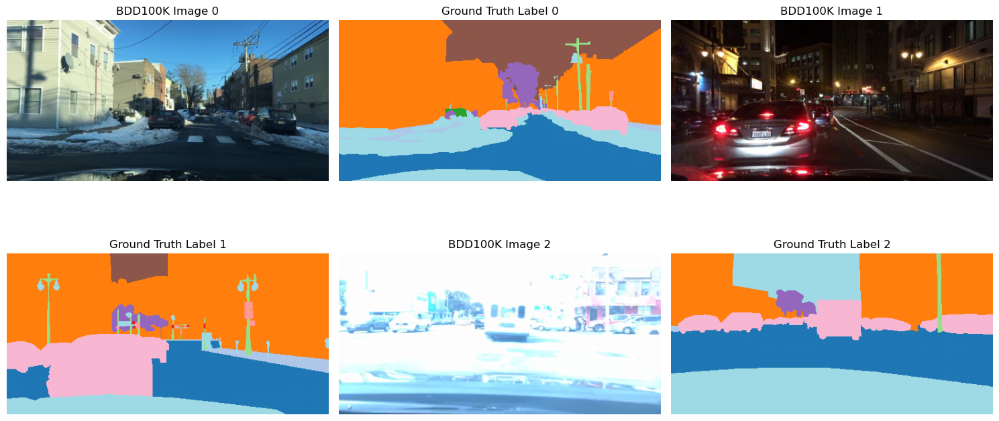

In [55]:
# Visualize a few BDD100K samples (val split)
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.flatten()

for i in range(3):
    img, lbl = bdd_val_dataset[i * 100]  # Sample every 100th image
    
    # Denormalize image
    img_np = img.permute(1, 2, 0).cpu().numpy()
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img_np = img_np * std + mean
    img_np = np.clip(img_np, 0, 1)
    
    axes[i*2].imshow(img_np)
    axes[i*2].set_title(f'BDD100K Image {i}')
    axes[i*2].axis('off')
    
    axes[i*2+1].imshow(lbl.cpu().numpy(), cmap='tab20', vmin=0, vmax=19)
    axes[i*2+1].set_title(f'Ground Truth Label {i}')
    axes[i*2+1].axis('off')

plt.tight_layout()
plt.show()

In [56]:
# Load the best SegFormer model trained on Cityscapes
best_model = SegFormer(num_classes=NUM_CLASSES, config={}, pretrained_model_name='nvidia/mit-b0')

model_path = get_weights_dir('SegFormer (CE)') / 'best_model.pth'
if model_path.exists():
    best_model.load_state_dict(torch.load(model_path, map_location=device))
    print(f'Loaded trained SegFormer from {model_path}')
else:
    print(f'WARNING: {model_path} not found!')

best_model = best_model.to(device)
best_model.eval()
print(f'Model on device: {device}')


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head.batch_norm.bias', 'decode_head.batch_norm.num_batches_tracked', 'decode_head.batch_norm.running_mean', 'decode_head.batch_norm.running_var', 'decode_head.batch_norm.weight', 'decode_head.classifier.bias', 'decode_head.classifier.weight', 'decode_head.linear_c.0.proj.bias', 'decode_head.linear_c.0.proj.weight', 'decode_head.linear_c.1.proj.bias', 'decode_head.linear_c.1.proj.weight', 'decode_head.linear_c.2.proj.bias', 'decode_head.linear_c.2.proj.weight', 'decode_head.linear_c.3.proj.bias', 'decode_head.linear_c.3.proj.weight', 'decode_head.linear_fuse.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loaded trained SegFormer from /mnt/c/Users/johnh/Desktop/simantik/METAPTYXIAKO assignments/MachineLearning/experiments/SegFormer_CE/weights/best_model.pth
Model on device: cuda


In [57]:
# Zero-shot evaluation on BDD100K
# Full val set + day/night/dawn_dusk subsets from val set

best_model_path = get_weights_dir('SegFormer (CE)') / 'best_model.pth'
if not best_model_path.exists():
    print(f'WARNING: {best_model_path} not found!')
    print('Make sure the main training loop has been run.')

print(f'Loading model from: {best_model_path}')
best_model = SegFormer(num_classes=NUM_CLASSES, config={}, pretrained_model_name='nvidia/mit-b0').to(device)
best_model.load_state_dict(torch.load(best_model_path, map_location=device))
best_model.eval()

bdd_eval_criterion = nn.CrossEntropyLoss(ignore_index=IGNORE_INDEX)

eval_sets = {
    'BDD100K Val (all)': bdd_val_loader,
    'BDD100K Val Day': bdd_day_loader,
    'BDD100K Val Night': bdd_night_loader,
    'BDD100K Val Dawn/Dusk': bdd_dawn_dusk_loader,
}

bdd_results = {}
for name, loader in eval_sets.items():
    if loader is None:
        print(f'\n{name}: SKIPPED (no samples)')
        continue

    metrics = [
        IoUMetric(NUM_CLASSES, ignore_index=255),
        DiceScoreMetric(NUM_CLASSES, ignore_index=255)
    ]
    val_loss, val_metrics = validate_epoch(
        best_model, loader, bdd_eval_criterion, device, metrics=metrics
    )
    bdd_results[name] = val_metrics
    print(f'\n{name}:')
    print(f'  Loss: {val_loss:.4f}  |  mIoU: {val_metrics["IoUMetric"]:.4f}  |  Dice: {val_metrics["DiceScoreMetric"]:.4f}')

print('\n' + '=' * 50)
print('Zero-shot BDD100K evaluation complete.')


Loading model from: /mnt/c/Users/johnh/Desktop/simantik/METAPTYXIAKO assignments/MachineLearning/experiments/SegFormer_CE/weights/best_model.pth


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head.batch_norm.bias', 'decode_head.batch_norm.num_batches_tracked', 'decode_head.batch_norm.running_mean', 'decode_head.batch_norm.running_var', 'decode_head.batch_norm.weight', 'decode_head.classifier.bias', 'decode_head.classifier.weight', 'decode_head.linear_c.0.proj.bias', 'decode_head.linear_c.0.proj.weight', 'decode_head.linear_c.1.proj.bias', 'decode_head.linear_c.1.proj.weight', 'decode_head.linear_c.2.proj.bias', 'decode_head.linear_c.2.proj.weight', 'decode_head.linear_c.3.proj.bias', 'decode_head.linear_c.3.proj.weight', 'decode_head.linear_fuse.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



BDD100K Val (all):
  Loss: 0.4863  |  mIoU: 0.4166  |  Dice: 0.5416



BDD100K Val Day:
  Loss: 0.5658  |  mIoU: 0.3945  |  Dice: 0.5120



BDD100K Val Night:
  Loss: 1.1787  |  mIoU: 0.2854  |  Dice: 0.3851



BDD100K Val Dawn/Dusk:
  Loss: 0.4698  |  mIoU: 0.3644  |  Dice: 0.4256

Zero-shot BDD100K evaluation complete.


## 7.1 Zero-Shot Results Visualization

Bar charts comparing mIoU and Dice across BDD100K subsets, plus qualitative predictions.


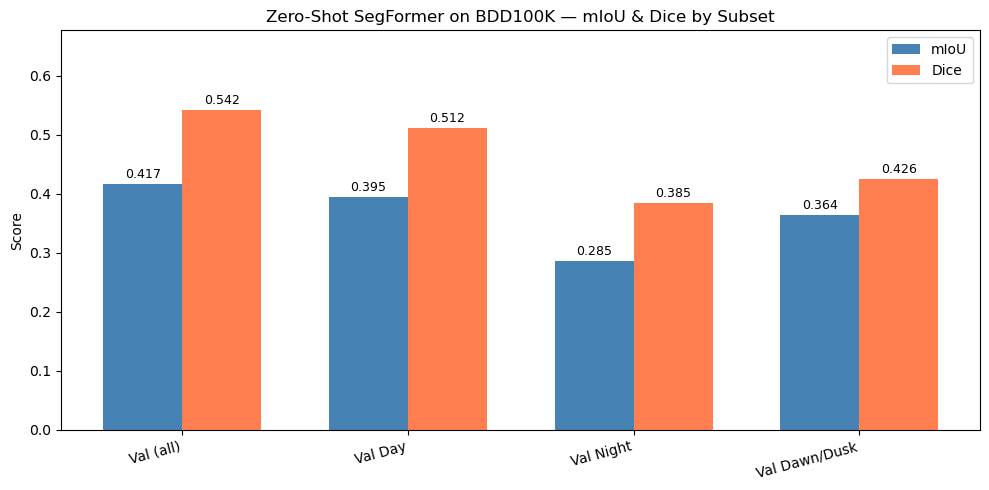

In [58]:
# --- Bar chart: Zero-shot mIoU & Dice across BDD100K subsets ---
import matplotlib.pyplot as plt
import numpy as np

# Collect results (skip subsets that were None)
viz_names = []
viz_miou = []
viz_dice = []
for name, metrics in bdd_results.items():
    viz_names.append(name.replace('BDD100K ', ''))
    viz_miou.append(metrics['IoUMetric'])
    viz_dice.append(metrics['DiceScoreMetric'])

x = np.arange(len(viz_names))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 5))
bars1 = ax.bar(x - width/2, viz_miou, width, label='mIoU', color='steelblue')
bars2 = ax.bar(x + width/2, viz_dice, width, label='Dice', color='coral')

ax.set_ylabel('Score')
ax.set_title('Zero-Shot SegFormer on BDD100K — mIoU & Dice by Subset')
ax.set_xticks(x)
ax.set_xticklabels(viz_names, rotation=15, ha='right')
ax.legend()
ax.set_ylim(0, max(max(viz_miou, default=0), max(viz_dice, default=0)) * 1.25)

# Add value labels on bars
for bar in bars1:
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
            f'{bar.get_height():.3f}', ha='center', va='bottom', fontsize=9)
for bar in bars2:
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
            f'{bar.get_height():.3f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.savefig(str(EXPERIMENTS_DIR / 'bdd_zeroshot_metrics.png'), dpi=150)
plt.show()


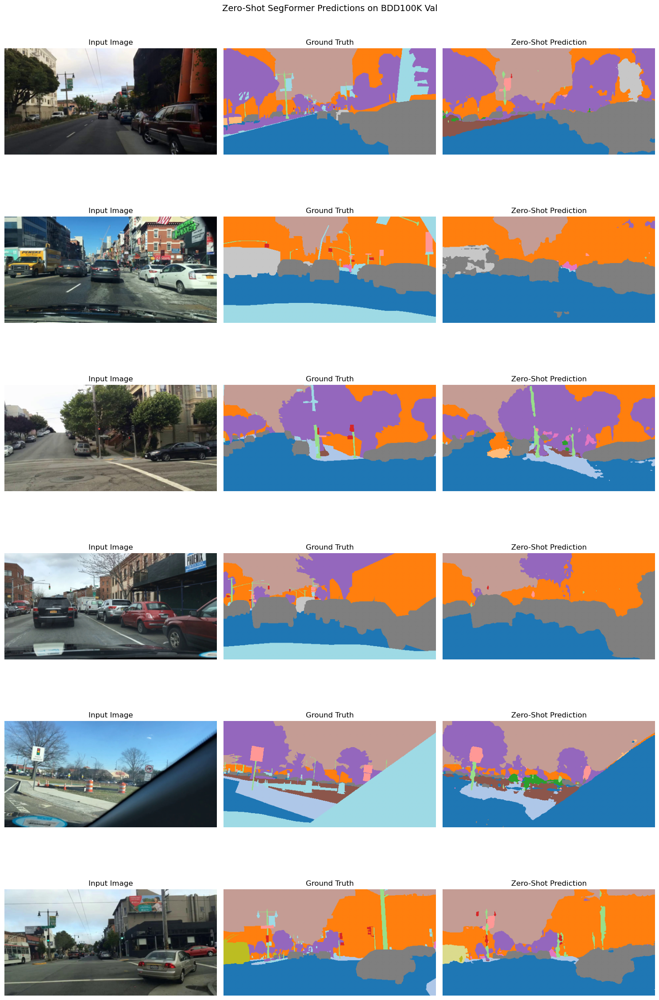

In [59]:
# --- Qualitative: zero-shot predictions on BDD100K val samples ---
import random

best_model.eval()
sample_indices = random.sample(range(len(bdd_val_dataset)), min(6, len(bdd_val_dataset)))

fig, axes = plt.subplots(len(sample_indices), 3, figsize=(15, 4 * len(sample_indices)))
if len(sample_indices) == 1:
    axes = axes[None, :]  # ensure 2D

mean = np.array([0.485, 0.456, 0.406])
std  = np.array([0.229, 0.224, 0.225])

for row, idx in enumerate(sample_indices):
    img_tensor, mask_tensor = bdd_val_dataset[idx]
    with torch.no_grad():
        pred = best_model(img_tensor.unsqueeze(0).to(device))
        pred_mask = pred.argmax(dim=1).squeeze().cpu().numpy()

    # Denormalize image for display
    img_np = img_tensor.permute(1, 2, 0).cpu().numpy() * std + mean
    img_np = np.clip(img_np, 0, 1)
    gt_mask = mask_tensor.cpu().numpy()

    axes[row, 0].imshow(img_np)
    axes[row, 0].set_title('Input Image')
    axes[row, 0].axis('off')

    axes[row, 1].imshow(gt_mask, cmap='tab20', vmin=0, vmax=NUM_CLASSES-1)
    axes[row, 1].set_title('Ground Truth')
    axes[row, 1].axis('off')

    axes[row, 2].imshow(pred_mask, cmap='tab20', vmin=0, vmax=NUM_CLASSES-1)
    axes[row, 2].set_title('Zero-Shot Prediction')
    axes[row, 2].axis('off')

plt.suptitle('Zero-Shot SegFormer Predictions on BDD100K Val', fontsize=14)
plt.tight_layout()
plt.savefig(str(EXPERIMENTS_DIR / 'bdd_zeroshot_qualitative.png'), dpi=150)
plt.show()


# 8. Few-shot Adaptation on BDD100K Night Images

Goal: fine-tune the Cityscapes-trained SegFormer on a *small* number of BDD100K night images,
then measure whether night performance improves without training on the full dataset.


In [60]:
# Few-shot settings
FEWSHOT_K = 5         # few-shot adaptation (5 night images)
FEWSHOT_EPOCHS = 5
FEWSHOT_LR = 1e-5
FEWSHOT_SEED = 42
FEWSHOT_LOSS = 'CE'   # options: 'CE', 'Weighted-CE', 'Dice'

# Make sure we have night indices
if not night_indices_train:
    raise ValueError('No NIGHT train images matched. Run the time-of-day split cell first.')
if not night_indices_val:
    raise ValueError('No NIGHT val images matched. Run the time-of-day split cell first.')

# Select single-shot training sample from TRAIN night images
rng = np.random.default_rng(FEWSHOT_SEED)
night_train_shuffled = night_indices_train.copy()
rng.shuffle(night_train_shuffled)
k = min(FEWSHOT_K, len(night_train_shuffled))
fewshot_train_idx = night_train_shuffled[:k]

# Evaluate on VAL night images (different from training)
fewshot_eval_idx = night_indices_val

fewshot_train = torch.utils.data.Subset(bdd_train_dataset, fewshot_train_idx)
fewshot_eval = torch.utils.data.Subset(bdd_val_dataset, fewshot_eval_idx)

fewshot_train_loader = DataLoader(
    fewshot_train,
    batch_size=min(BATCH_SIZE, max(1, k)),
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

fewshot_eval_loader = DataLoader(
    fewshot_eval,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

print(f'Few-shot train: {len(fewshot_train)} image(s)')
print(f'Night eval (val):  {len(fewshot_eval)} images')

# Clone the best model so we can compare before/after
fewshot_model = copy.deepcopy(best_model).to(device)

# Optionally freeze the encoder for stability
if hasattr(fewshot_model, 'model') and hasattr(fewshot_model.model, 'segformer'):
    for p in fewshot_model.model.segformer.parameters():
        p.requires_grad = False
    print('Frozen SegFormer encoder (training decode head only)')

# Loss selection
if FEWSHOT_LOSS == 'CE':
    fewshot_criterion = nn.CrossEntropyLoss(ignore_index=IGNORE_INDEX)
elif FEWSHOT_LOSS == 'Weighted-CE':
    fewshot_criterion = nn.CrossEntropyLoss(weight=class_weights.to(device), ignore_index=IGNORE_INDEX)
elif FEWSHOT_LOSS == 'Dice':
    fewshot_criterion = DiceLoss(num_classes=NUM_CLASSES, ignore_index=IGNORE_INDEX)
else:
    raise ValueError(f'Unknown FEWSHOT_LOSS: {FEWSHOT_LOSS}')

optimizer = optim.AdamW(filter(lambda p: p.requires_grad, fewshot_model.parameters()), lr=FEWSHOT_LR, weight_decay=1e-4)

# Evaluate BEFORE single-shot adaptation (on VAL night)
print('\nBefore few-shot adaptation:')
_, base_metrics = validate_epoch(
    fewshot_model, fewshot_eval_loader, nn.CrossEntropyLoss(ignore_index=IGNORE_INDEX), device,
    metrics=[IoUMetric(NUM_CLASSES, ignore_index=255), DiceScoreMetric(NUM_CLASSES, ignore_index=255)]
)
print(f"Baseline Night mIoU: {base_metrics['IoUMetric']:.4f}")
print(f"Baseline Night Dice: {base_metrics['DiceScoreMetric']:.4f}")

# Few-shot fine-tuning
for epoch in range(FEWSHOT_EPOCHS):
    train_loss, _ = train_epoch(
        fewshot_model, fewshot_train_loader, optimizer, fewshot_criterion, device,
        metrics=[IoUMetric(NUM_CLASSES, ignore_index=255), DiceScoreMetric(NUM_CLASSES, ignore_index=255)]
    )
    val_loss, val_metrics = validate_epoch(
        fewshot_model, fewshot_eval_loader, nn.CrossEntropyLoss(ignore_index=IGNORE_INDEX), device,
        metrics=[IoUMetric(NUM_CLASSES, ignore_index=255), DiceScoreMetric(NUM_CLASSES, ignore_index=255)]
    )
    print(f"Epoch {epoch+1}/{FEWSHOT_EPOCHS} | Train Loss: {train_loss:.4f} | Night mIoU: {val_metrics['IoUMetric']:.4f} | Dice: {val_metrics['DiceScoreMetric']:.4f}")

print('\nFew-shot adaptation complete.')

# Export variables for visualization cells
fewshot_before = base_metrics
fewshot_after = val_metrics
adapted_model = fewshot_model


Few-shot train: 5 image(s)
Night eval (val):  13 images
Frozen SegFormer encoder (training decode head only)

Before few-shot adaptation:


Baseline Night mIoU: 0.2854
Baseline Night Dice: 0.3851


Epoch 1/5 | Train Loss: 1.2858 | Night mIoU: 0.2855 | Dice: 0.3850


Epoch 2/5 | Train Loss: 2.1154 | Night mIoU: 0.2863 | Dice: 0.3856


Epoch 3/5 | Train Loss: 1.3464 | Night mIoU: 0.2860 | Dice: 0.3849


Epoch 4/5 | Train Loss: 1.6079 | Night mIoU: 0.2868 | Dice: 0.3856


Epoch 5/5 | Train Loss: 1.3285 | Night mIoU: 0.2868 | Dice: 0.3853

Few-shot adaptation complete.


## 8.1 Few-Shot Adaptation Results

Compare night-image performance before and after few-shot adaptation.


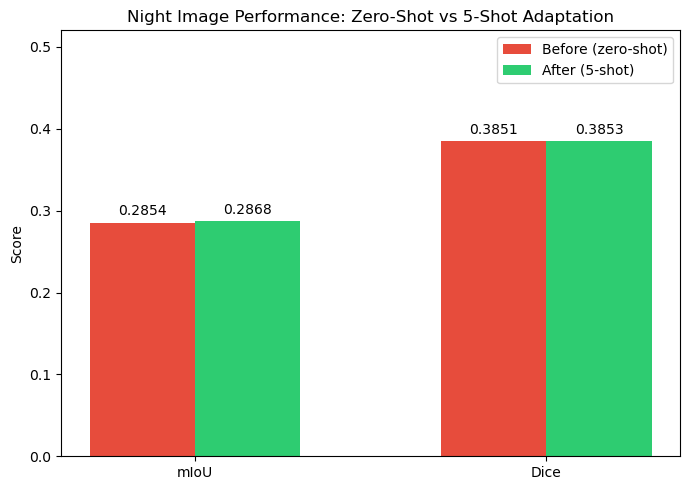

In [61]:
# --- Bar chart: Before vs After few-shot adaptation on night images ---
# fewshot_before and fewshot_after should be defined in the few-shot cell

labels = ['mIoU', 'Dice']
before_vals = [fewshot_before.get('IoUMetric', 0), fewshot_before.get('DiceScoreMetric', 0)]
after_vals  = [fewshot_after.get('IoUMetric', 0), fewshot_after.get('DiceScoreMetric', 0)]

x = np.arange(len(labels))
width = 0.3

fig, ax = plt.subplots(figsize=(7, 5))
b1 = ax.bar(x - width/2, before_vals, width, label='Before (zero-shot)', color='#e74c3c')
b2 = ax.bar(x + width/2, after_vals,  width, label='After (5-shot)',     color='#2ecc71')

ax.set_ylabel('Score')
ax.set_title('Night Image Performance: Zero-Shot vs 5-Shot Adaptation')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()
ax.set_ylim(0, max(max(before_vals, default=0.01), max(after_vals, default=0.01)) * 1.35)

for bar in b1:
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
            f'{bar.get_height():.4f}', ha='center', va='bottom', fontsize=10)
for bar in b2:
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
            f'{bar.get_height():.4f}', ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.savefig(str(EXPERIMENTS_DIR / 'bdd_fewshot_comparison.png'), dpi=150)
plt.show()


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head.batch_norm.bias', 'decode_head.batch_norm.num_batches_tracked', 'decode_head.batch_norm.running_mean', 'decode_head.batch_norm.running_var', 'decode_head.batch_norm.weight', 'decode_head.classifier.bias', 'decode_head.classifier.weight', 'decode_head.linear_c.0.proj.bias', 'decode_head.linear_c.0.proj.weight', 'decode_head.linear_c.1.proj.bias', 'decode_head.linear_c.1.proj.weight', 'decode_head.linear_c.2.proj.bias', 'decode_head.linear_c.2.proj.weight', 'decode_head.linear_c.3.proj.bias', 'decode_head.linear_c.3.proj.weight', 'decode_head.linear_fuse.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


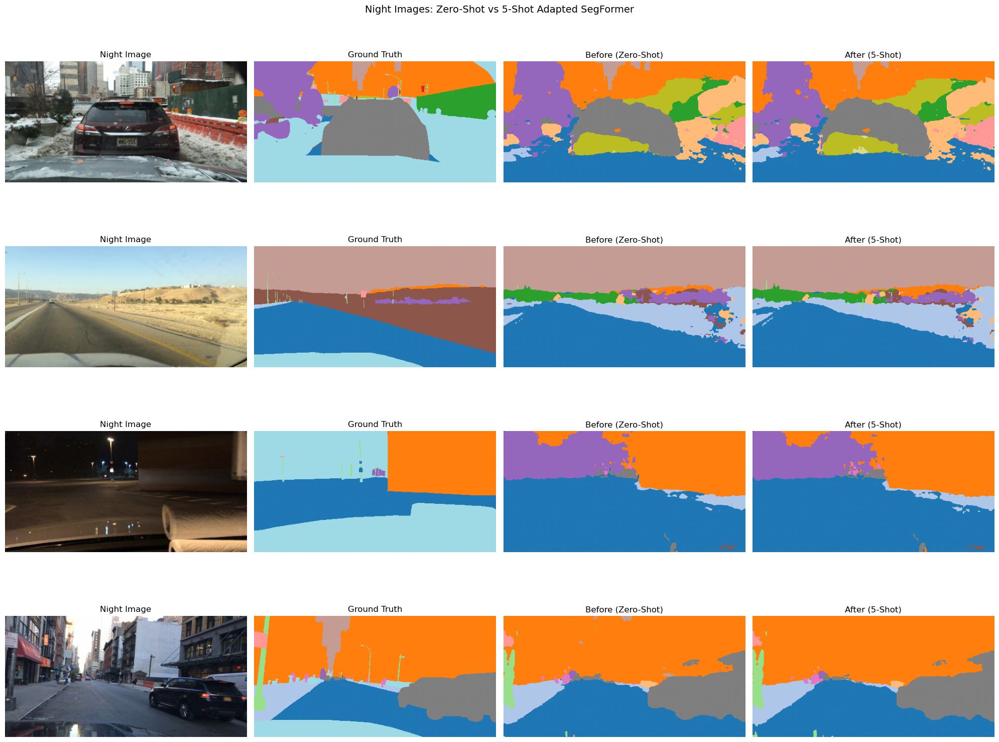

In [62]:
# --- Qualitative: before vs after on night images ---
# Use the night val indices for visualization
night_val_indices = val_buckets.get('night', [])
if len(night_val_indices) == 0:
    print('No night val images available for visualization.')
else:
    n_show = min(4, len(night_val_indices))
    show_indices = random.sample(night_val_indices, n_show)

    fig, axes = plt.subplots(n_show, 4, figsize=(20, 4 * n_show))
    if n_show == 1:
        axes = axes[None, :]

    # Load the original zero-shot model for "before"
    zs_model = SegFormer(num_classes=NUM_CLASSES, config={}, pretrained_model_name='nvidia/mit-b0').to(device)
    best_path = get_weights_dir('SegFormer (CE)') / 'best_model.pth'
    zs_model.load_state_dict(torch.load(best_path, map_location=device))
    zs_model.eval()

    # adapted_model should exist from the few-shot cell
    adapted_model.eval()

    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])

    for row, idx in enumerate(show_indices):
        img_tensor, mask_tensor = bdd_val_dataset[idx]
        inp = img_tensor.unsqueeze(0).to(device)

        with torch.no_grad():
            pred_before = zs_model(inp).argmax(dim=1).squeeze().cpu().numpy()
            pred_after  = adapted_model(inp).argmax(dim=1).squeeze().cpu().numpy()

        img_np = img_tensor.permute(1, 2, 0).cpu().numpy() * std + mean
        img_np = np.clip(img_np, 0, 1)
        gt_mask = mask_tensor.cpu().numpy()

        axes[row, 0].imshow(img_np)
        axes[row, 0].set_title('Night Image')
        axes[row, 0].axis('off')

        axes[row, 1].imshow(gt_mask, cmap='tab20', vmin=0, vmax=NUM_CLASSES-1)
        axes[row, 1].set_title('Ground Truth')
        axes[row, 1].axis('off')

        axes[row, 2].imshow(pred_before, cmap='tab20', vmin=0, vmax=NUM_CLASSES-1)
        axes[row, 2].set_title('Before (Zero-Shot)')
        axes[row, 2].axis('off')

        axes[row, 3].imshow(pred_after, cmap='tab20', vmin=0, vmax=NUM_CLASSES-1)
        axes[row, 3].set_title('After (5-Shot)')
        axes[row, 3].axis('off')

    plt.suptitle('Night Images: Zero-Shot vs 5-Shot Adapted SegFormer', fontsize=14)
    plt.tight_layout()
    plt.savefig(str(EXPERIMENTS_DIR / 'bdd_fewshot_qualitative.png'), dpi=150)
    plt.show()

    del zs_model  # free memory


In [63]:
# --- Per-class IoU breakdown on BDD100K Val (all) ---
class_names = [
    'road', 'sidewalk', 'building', 'wall', 'fence',
    'pole', 'traffic light', 'traffic sign', 'vegetation', 'terrain',
    'sky', 'person', 'rider', 'car', 'truck',
    'bus', 'train', 'motorcycle', 'bicycle'
]

# Run a dedicated pass to get the confusion matrix
bdd_iou_metric = IoUMetric(NUM_CLASSES, ignore_index=255)
bdd_dice_metric = DiceScoreMetric(NUM_CLASSES, ignore_index=255)
ce_crit_bdd = nn.CrossEntropyLoss(ignore_index=IGNORE_INDEX)

best_model.eval()
_, bdd_pc_metrics = validate_epoch(
    best_model, bdd_val_loader, ce_crit_bdd, device,
    metrics=[bdd_iou_metric, bdd_dice_metric]
)

hist_m = bdd_iou_metric.hist
tp = torch.diag(hist_m)
fp = hist_m.sum(dim=0) - tp
fn = hist_m.sum(dim=1) - tp
per_class_iou = (tp / (tp + fp + fn + 1e-6)).cpu().numpy()
miou = per_class_iou.mean()

print('Per-Class IoU on BDD100K Val (zero-shot):')
print(f'{"Class":<20} {"IoU":>8}')
print('-' * 30)
for name, iou_val in zip(class_names, per_class_iou):
    print(f'{name:<20} {iou_val:>8.4f}')
print('-' * 30)
print(f'{"Mean IoU":<20} {miou:>8.4f}')


Per-Class IoU on BDD100K Val (zero-shot):
Class                     IoU
------------------------------
road                   0.8827
sidewalk               0.4708
building               0.7380
wall                   0.2187
fence                  0.1645
pole                   0.2249
traffic light          0.2039
traffic sign           0.2048
vegetation             0.7872
terrain                0.3684
sky                    0.8815
person                 0.4899
rider                  0.3244
car                    0.7952
truck                  0.2346
bus                    0.3697
train                  0.0000
motorcycle             0.3294
bicycle                0.2271
------------------------------
Mean IoU               0.4166


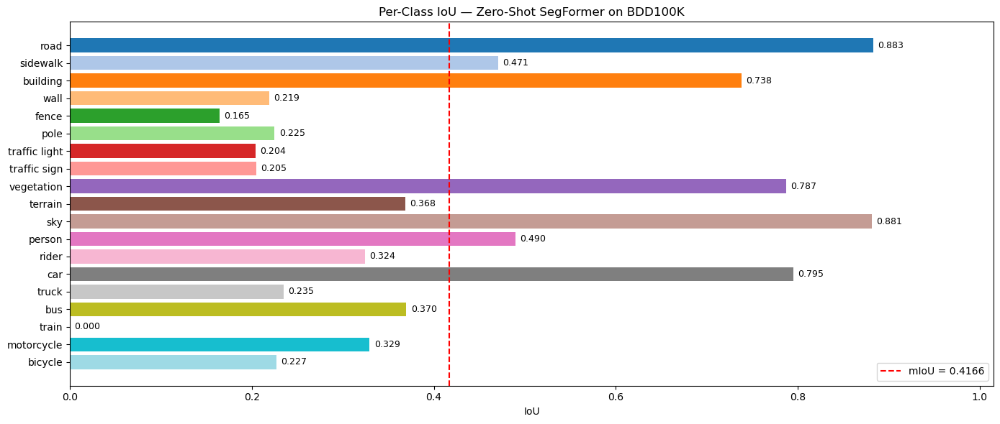

In [64]:
# --- BDD100K Per-Class IoU Bar Chart ---
# Uses bdd_iou_metric from the cell above

class_names_bdd = [
    'road', 'sidewalk', 'building', 'wall', 'fence',
    'pole', 'traffic light', 'traffic sign', 'vegetation', 'terrain',
    'sky', 'person', 'rider', 'car', 'truck',
    'bus', 'train', 'motorcycle', 'bicycle'
]

iou_np = per_class_iou  # already computed as numpy in the cell above
colors_pc = plt.cm.tab20(np.linspace(0, 1, len(class_names_bdd)))

fig, ax = plt.subplots(figsize=(14, 6))
bars = ax.barh(class_names_bdd, iou_np, color=colors_pc)
ax.set_xlabel('IoU')
ax.set_title('Per-Class IoU — Zero-Shot SegFormer on BDD100K')
ax.set_xlim(0, max(iou_np) * 1.15)
ax.invert_yaxis()
for bar, val in zip(bars, iou_np):
    ax.text(bar.get_width() + 0.005, bar.get_y() + bar.get_height()/2,
            f'{val:.3f}', va='center', fontsize=9)
ax.axvline(x=np.mean(iou_np), color='red', linestyle='--', label=f'mIoU = {np.mean(iou_np):.4f}')
ax.legend()
plt.tight_layout()
plt.savefig(str(EXPERIMENTS_DIR / 'bdd_perclass_iou.png'), dpi=150, bbox_inches='tight')
plt.show()


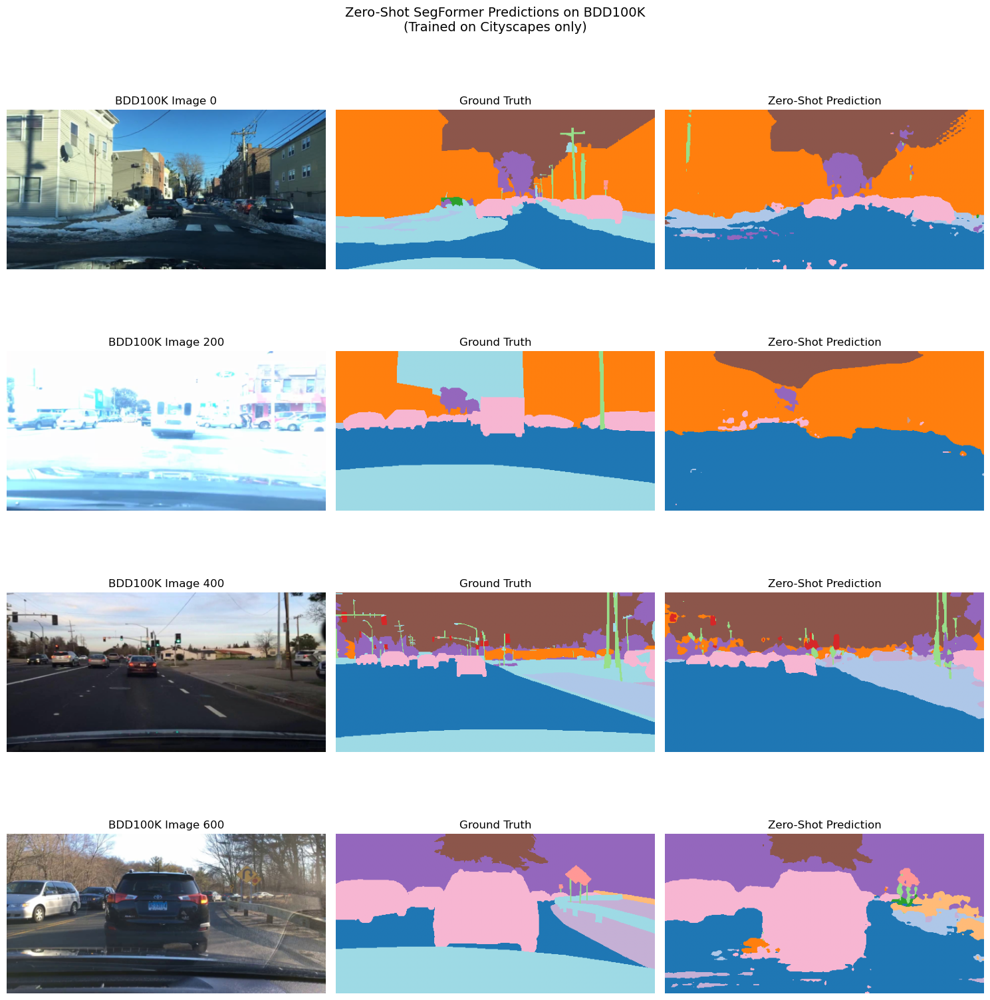

In [65]:
# Visualize predictions on a few samples
fig, axes = plt.subplots(4, 3, figsize=(15, 16))

sample_indices = [i for i in [0, 200, 400, 600] if i < len(bdd_val_dataset)]  # safe indexing

best_model.eval()
with torch.no_grad():
    for row, idx in enumerate(sample_indices):
        img, lbl = bdd_val_dataset[idx]
        
        # Get prediction
        img_batch = img.unsqueeze(0).to(device)
        output = best_model(img_batch)
        pred = torch.argmax(output, dim=1).squeeze(0).cpu()
        
        # Denormalize image
        img_np = img.permute(1, 2, 0).cpu().numpy()
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img_np = img_np * std + mean
        img_np = np.clip(img_np, 0, 1)
        
        # Plot
        axes[row, 0].imshow(img_np)
        axes[row, 0].set_title(f'BDD100K Image {idx}')
        axes[row, 0].axis('off')
        
        axes[row, 1].imshow(lbl.cpu().numpy(), cmap='tab20', vmin=0, vmax=19)
        axes[row, 1].set_title('Ground Truth')
        axes[row, 1].axis('off')
        
        axes[row, 2].imshow(pred.cpu().numpy(), cmap='tab20', vmin=0, vmax=19)
        axes[row, 2].set_title('Zero-Shot Prediction')
        axes[row, 2].axis('off')

plt.suptitle('Zero-Shot SegFormer Predictions on BDD100K\n(Trained on Cityscapes only)', fontsize=14, y=0.995)
plt.tight_layout()
plt.show()

# 9. Grand Summary

All experiments at a glance.


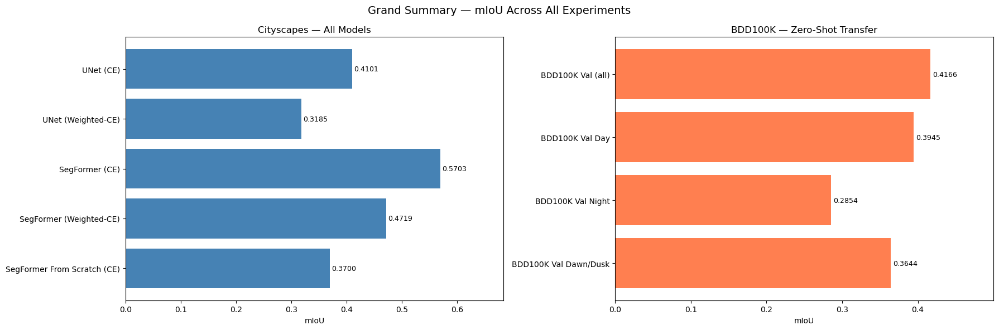


Experiment                                   mIoU      Dataset
UNet (CE)                                  0.4101   Cityscapes
UNet (Weighted-CE)                         0.3185   Cityscapes
SegFormer (CE)                             0.5703   Cityscapes
SegFormer (Weighted-CE)                    0.4719   Cityscapes
SegFormer From Scratch (CE)                0.3700   Cityscapes
BDD100K Val (all)                          0.4166      BDD100K
BDD100K Val Day                            0.3945      BDD100K
BDD100K Val Night                          0.2854      BDD100K
BDD100K Val Dawn/Dusk                      0.3644      BDD100K


In [66]:
# --- Grand Summary: All experiments side by side ---
summary = {}

# Cityscapes main experiments
for r in model_results:
    summary[r['Model']] = {'mIoU': r['Best mIoU'], 'source': 'Cityscapes'}

# SegFormer from scratch
summary['SegFormer From Scratch (CE)'] = {'mIoU': scratch_best_miou, 'source': 'Cityscapes'}

# BDD100K zero-shot results
for name, metrics in bdd_results.items():
    summary[name] = {'mIoU': metrics['IoUMetric'], 'source': 'BDD100K'}

# Sort by source then mIoU
cs_items = [(k, v) for k, v in summary.items() if v['source'] == 'Cityscapes']
bdd_items = [(k, v) for k, v in summary.items() if v['source'] == 'BDD100K']

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Cityscapes subplot
cs_names = [k for k, _ in cs_items]
cs_vals = [v['mIoU'] for _, v in cs_items]
bars1 = axes[0].barh(cs_names, cs_vals, color='steelblue')
axes[0].set_xlabel('mIoU')
axes[0].set_title('Cityscapes — All Models')
axes[0].set_xlim(0, max(cs_vals + [0.01]) * 1.2)
axes[0].invert_yaxis()
for bar, val in zip(bars1, cs_vals):
    axes[0].text(bar.get_width() + 0.003, bar.get_y() + bar.get_height()/2,
                f'{val:.4f}', va='center', fontsize=9)

# BDD100K subplot
bdd_names = [k for k, _ in bdd_items]
bdd_vals = [v['mIoU'] for _, v in bdd_items]
if bdd_vals:
    bars2 = axes[1].barh(bdd_names, bdd_vals, color='coral')
    axes[1].set_xlabel('mIoU')
    axes[1].set_title('BDD100K — Zero-Shot Transfer')
    axes[1].set_xlim(0, max(bdd_vals + [0.01]) * 1.2)
    axes[1].invert_yaxis()
    for bar, val in zip(bars2, bdd_vals):
        axes[1].text(bar.get_width() + 0.003, bar.get_y() + bar.get_height()/2,
                    f'{val:.4f}', va='center', fontsize=9)

plt.suptitle('Grand Summary — mIoU Across All Experiments', fontsize=14)
plt.tight_layout()
plt.savefig(str(EXPERIMENTS_DIR / 'grand_summary.png'), dpi=150, bbox_inches='tight')
plt.show()

# Print summary table
print('\n' + '=' * 60)
print(f'{"Experiment":<40} {"mIoU":>8} {"Dataset":>12}')
print('=' * 60)
for name, info in summary.items():
    print(f'{name:<40} {info["mIoU"]:>8.4f} {info["source"]:>12}')
print('=' * 60)
